"<h1><center><font size='5'>Life Expectancy</font></center></h1><center>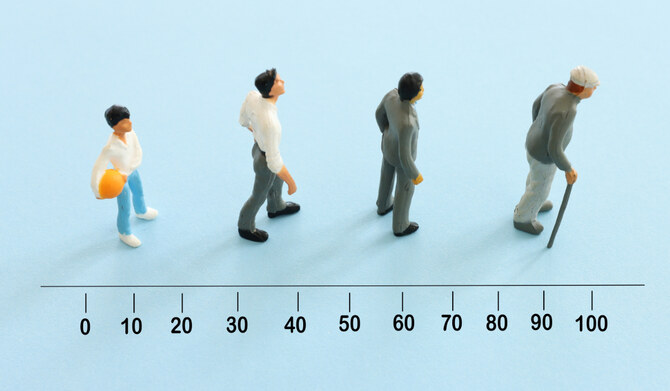</img></center>"


**Import Libraries**

In [1]:
import os 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
import missingno as msno
from scipy.stats.mstats import winsorize
from scipy.stats import pearsonr
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder
from sklearn.model_selection import train_test_split,cross_val_score,cross_validate,RandomizedSearchCV,GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, LogisticRegression,Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import confusion_matrix, accuracy_score
import optuna
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import joblib
import anvil.server
from flask import Flask, request, jsonify, render_template
from flask_cors import CORS
import pickle
import warnings
warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid", palette="pastel") 
plt.style.use("seaborn-v0_8-whitegrid")

**Read Data**

In [2]:
df = pd.read_csv("Life Expectancy Data.csv")

**Dataset Attributes**

<table>
  <thead>
    <tr>
      <th>Attribute</th>
      <th>Description</th>
    </tr>
  </thead>
  <tbody>
    <tr><td>Status</td><td>Developed or Developing status</td></tr>
    <tr><td>Life Expectancy</td><td>Life Expectancy in age</td></tr>
    <tr><td>Adult Mortality</td><td>Adult Mortality Rates of both sexes (probability of dying between 15 and 60 years per 1000 population)</td></tr>
    <tr><td>Infant deaths</td><td>Number of Infant Deaths per 1000 population</td></tr>
    <tr><td>Alcohol</td><td>Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol)</td></tr>
    <tr><td>Percentage expenditure</td><td>Expenditure on health as a percentage of Gross Domestic Product per capita (%)</td></tr>
    <tr><td>Hepatitis B</td><td>Hepatitis B (HepB) immunization coverage among 1-year-olds (%)</td></tr>
    <tr><td>Measles</td><td>Measles - number of reported cases per 1000 population</td></tr>
    <tr><td>BMI</td><td>Average Body Mass Index of entire population</td></tr>
    <tr><td>Under-five deaths</td><td>Number of under-five deaths per 1000 population</td></tr>
    <tr><td>Polio</td><td>Polio (Pol3) immunization coverage among 1-year-olds (%)</td></tr>
    <tr><td>Total expenditure</td><td>General government expenditure on health as a percentage of total government expenditure (%)</td></tr>
    <tr><td>Diphtheria</td><td>Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)</td></tr>
    <tr><td>HIV/AIDS</td><td>Deaths per 1000 live births HIV/AIDS (0-4 years)</td></tr>
    <tr><td>GDP</td><td>Gross Domestic Product per capita (in USD)</td></tr>
    <tr><td>Population</td><td>Population of the country</td></tr>
    <tr><td>Thinness 1-19 years</td><td>Prevalence of thinness among children and adolescents for Age 10 to 19 (%)</td></tr>
    <tr><td>Thinness 5-9 years</td><td>Prevalence of thinness among children for Age 5 to 9 (%)</td></tr>
    <tr><td>Income composition of resources</td><td>Human Development Index in terms of income composition of resources (index ranging from 0 to 1)</td></tr>
    <tr><td>Schooling</td><td>Number of years of Schooling (years)</td></tr>
  </tbody>
</table>


**Quick Overview**

In [3]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [5]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


## Preprocessing

In [6]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

**Rename Columns**

In [7]:
df.rename(columns = lambda x:x.strip(),inplace = True)
df.rename(columns={"thinness  1-19 years":"thinness 10-19 years"},inplace= True)

**Separating Categorical Columns from Numrical Columns**

In [8]:
Num_col = []
Cat_col = []
for c in df.columns:
    if df[c].dtype == "object":
        Cat_col.append(c)
    else:
        Num_col.append(c)

In [9]:
print(Cat_col)
print(30*"-")
print(Num_col)

['Country', 'Status']
------------------------------
['Year', 'Life expectancy', 'Adult Mortality', 'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness 10-19 years', 'thinness 5-9 years', 'Income composition of resources', 'Schooling']


-----

## Detecting Data Entry Error

Before handling NULLs Checking Data Entry Error is very important as it can help in dealing with outliers and making data realistic<br>
**This is done by two ways:**
- checking for values less than 0 (in this dataset all columns must be positive)
- checking if columns have  higher values ​​than it should

In [10]:
for i in Num_col[2:]:
    print(f"Min value in {i} is {df[i].min()} and max value is {df[i].max()}")

Min value in Adult Mortality is 1.0 and max value is 723.0
Min value in infant deaths is 0 and max value is 1800
Min value in Alcohol is 0.01 and max value is 17.87
Min value in percentage expenditure is 0.0 and max value is 19479.91161
Min value in Hepatitis B is 1.0 and max value is 99.0
Min value in Measles is 0 and max value is 212183
Min value in BMI is 1.0 and max value is 87.3
Min value in under-five deaths is 0 and max value is 2500
Min value in Polio is 3.0 and max value is 99.0
Min value in Total expenditure is 0.37 and max value is 17.6
Min value in Diphtheria is 2.0 and max value is 99.0
Min value in HIV/AIDS is 0.1 and max value is 50.6
Min value in GDP is 1.68135 and max value is 119172.7418
Min value in Population is 34.0 and max value is 1293859294.0
Min value in thinness 10-19 years is 0.1 and max value is 27.7
Min value in thinness 5-9 years is 0.1 and max value is 28.6
Min value in Income composition of resources is 0.0 and max value is 0.948
Min value in Schooling i

**`Adult Mortality` : probability of dying between 15 and 60 years per 1000 population , so `minimum value 1` doesn"t make sense**<br>
**`Infant deaths` : Number of Infant Deaths per 1000 population , so `minimum value 0` and `maximum value 1800`  doesn"t make sense**<br>
**`percentage expenditure`: Expenditure on health as a percentage of GDP per capita (%) , minimum value = 0 and maximum = 18961.3486 not realistic**<br>
**`Measles`:Number of reported cases per 1000 population , max value is 212183 not realistic as the column per 1000**<br>
**`Under-five deaths` : Number of under-five deaths per 1000 population , `max value is 2500` can"t be realistic**<br>
**`GDP` : Min value in GDP is `1.68135` is too low  and max value is 119172.74 high but can be acceptable in rich countries**<br>
**`Population` : Min value in Population is `34` isn"t real**<br>
**`Income composition of resources` : min value is 0.0 doesn"t make sense as the poorest countries has some resources**

## Handling Data Entry Error

----

**infant deaths this column can"t exceed 1000**

In [11]:
df.loc[df["infant deaths"] > 1000, "infant deaths"] = np.nan
df["infant deaths"].max()

1000.0

<Axes: xlabel='infant deaths', ylabel='Count'>

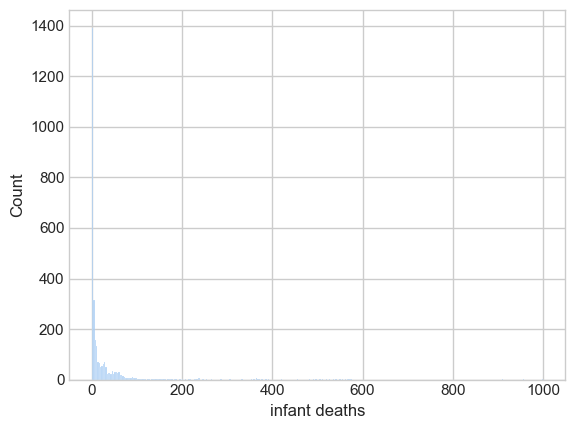

In [12]:
sns.histplot(df["infant deaths"])

---

**percentage expenditure : minimum value = 0 and maximum = 18961.3486 not realistic**

In [13]:
df["percentage expenditure"] = df["percentage expenditure"].apply(lambda x: np.nan if x > 100 else x)

<Axes: xlabel='percentage expenditure', ylabel='Count'>

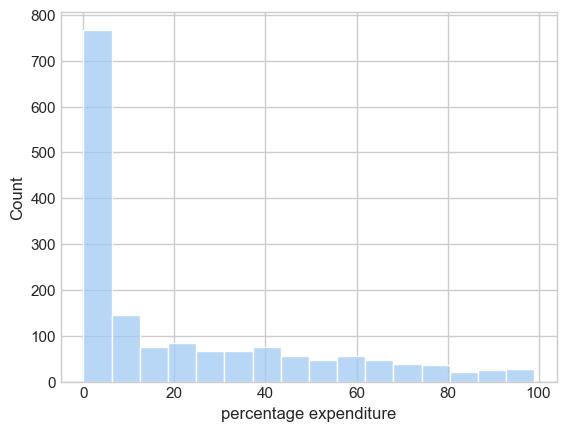

In [14]:
sns.histplot(df["percentage expenditure"])

----

**`Measles`:Number of reported cases per 1000 population, max value is 212183 is wrong**

In [15]:
df["Measles"] = df["Measles"].apply(lambda x: np.nan if x > 1000 else x)

<Axes: xlabel='Measles', ylabel='Count'>

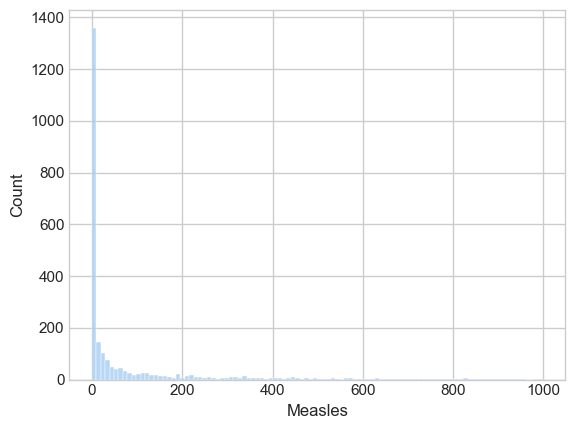

In [16]:
sns.histplot(df["Measles"])

----

In [17]:
 df["under-five deaths"] = df["under-five deaths"].apply(lambda x: np.nan if x > 1000 else x)

<Axes: xlabel='under-five deaths', ylabel='Count'>

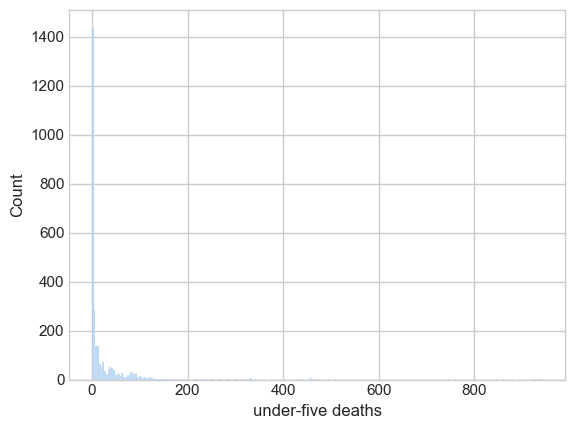

In [18]:
sns.histplot(df["under-five deaths"])

------

### Handling Missing data

#### Checking for NULLs

In [19]:
df.isna().sum()

Country                               0
Year                                  0
Status                                0
Life expectancy                      10
Adult Mortality                      10
infant deaths                        13
Alcohol                             194
percentage expenditure             1303
Hepatitis B                         553
Measles                             525
BMI                                  34
under-five deaths                    16
Polio                                19
Total expenditure                   226
Diphtheria                           19
HIV/AIDS                              0
GDP                                 448
Population                          652
thinness 10-19 years                 34
thinness 5-9 years                   34
Income composition of resources     167
Schooling                           163
dtype: int64

**Percentage of NULLs in each column**

In [20]:
NULLs_Percentage = (df.isna().mean()*100).round(2).sort_values(ascending = False)
print(NULLs_Percentage)

percentage expenditure             44.35
Population                         22.19
Hepatitis B                        18.82
Measles                            17.87
GDP                                15.25
Total expenditure                   7.69
Alcohol                             6.60
Income composition of resources     5.68
Schooling                           5.55
thinness 5-9 years                  1.16
thinness 10-19 years                1.16
BMI                                 1.16
Diphtheria                          0.65
Polio                               0.65
under-five deaths                   0.54
infant deaths                       0.44
Adult Mortality                     0.34
Life expectancy                     0.34
HIV/AIDS                            0.00
Year                                0.00
Status                              0.00
Country                             0.00
dtype: float64


**Visualize NULLs**

<Axes: >

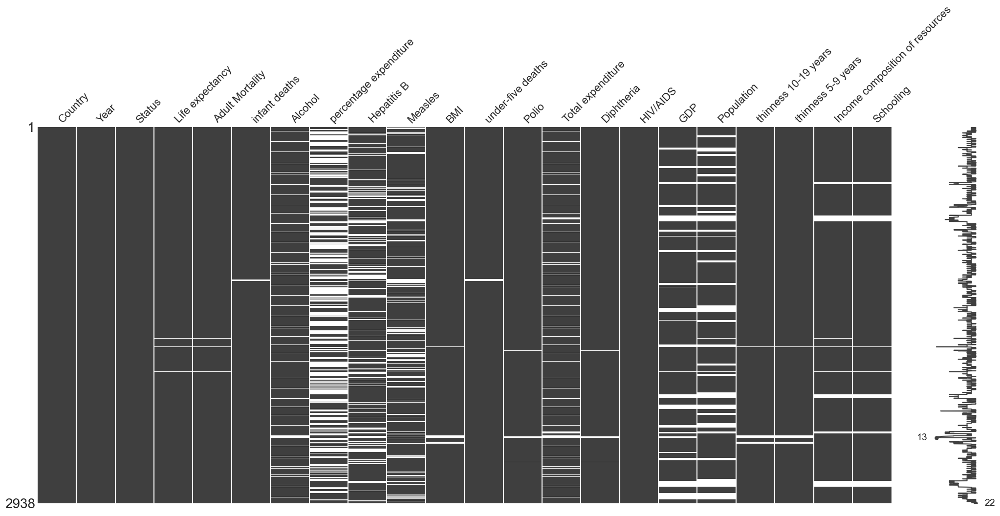

In [21]:
msno.matrix(df)

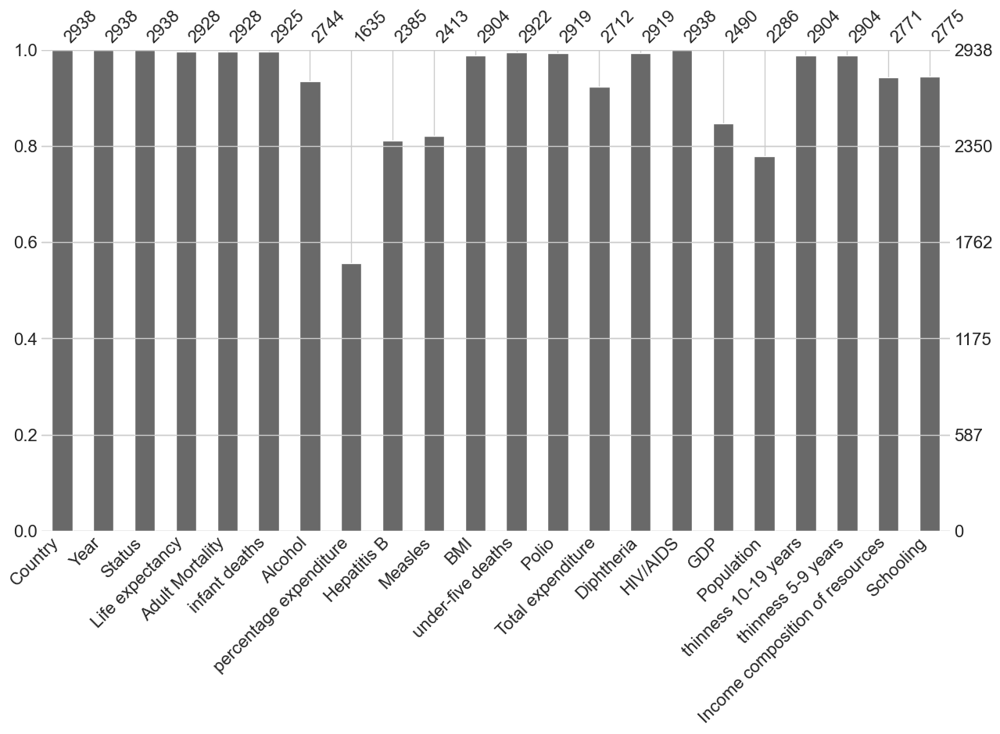

In [22]:
msno.bar(df,figsize=(15,8))
plt.show()

<Axes: >

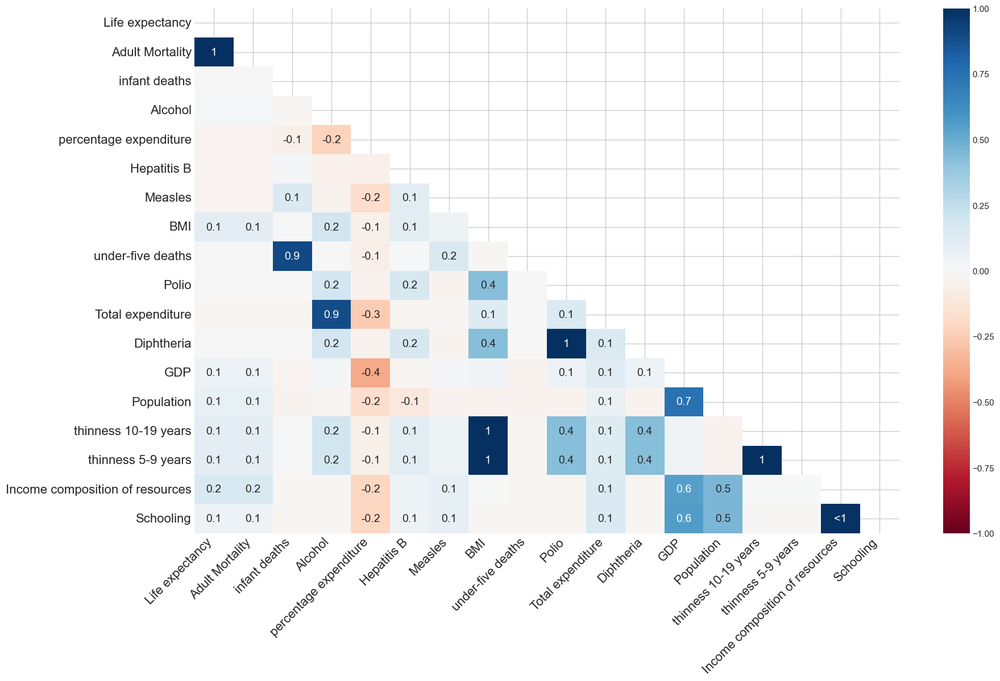

In [23]:
msno.heatmap(df)

**thinness 5-9 years** & **thinness 10-19 years** : They are `almost identical`, if one is missing ,the other will be perfect for imputation<br>
**Total expenditure** & **Life expectancy**	: More spending to health is linked to higher life expectancy<br>
**GDP** & **Population** : Countries with more people tend to have more GDP<br>
**Schooling** & **Income composition of resources**: More schooling is linked to better income

**Handling NULLs**

In [24]:
df.isna().sum()

Country                               0
Year                                  0
Status                                0
Life expectancy                      10
Adult Mortality                      10
infant deaths                        13
Alcohol                             194
percentage expenditure             1303
Hepatitis B                         553
Measles                             525
BMI                                  34
under-five deaths                    16
Polio                                19
Total expenditure                   226
Diphtheria                           19
HIV/AIDS                              0
GDP                                 448
Population                          652
thinness 10-19 years                 34
thinness 5-9 years                   34
Income composition of resources     167
Schooling                           163
dtype: int64

In [25]:
to_fill_mode = ["Polio","Diphtheria","Hepatitis B","Measles"]
to_fill_Median = ["Life expectancy","Adult Mortality","BMI"]

#filling with mode
for col in to_fill_mode:
    df[col] = df.groupby("Country")[col].transform(lambda x:x.fillna(x.mode().iloc[0])if not x.mode().empty else x)
#filling with median
for col in to_fill_Median:
    global_Med = df[col].median()
    df[col] = df.groupby("Country")[col].transform(lambda x:x.fillna(x.median()) if not pd.isna(x.median()) else global_Med)
#filling with interploate
for col in ["GDP", "Population", "Alcohol", "Total expenditure"]:
    df[col] = df.groupby("Country")[col].transform(lambda x:x.interpolate(method="linear", limit_direction="both"))

Filling the Columns **"Polio","Diphtheria","Hepatitis B"** with the **Mode** because immunization rates are often stable for several years.<br>
Filling the Columns **"Life expectancy","Adult Mortality","BMI"** with the **Median value of each country** because the distribution is skewed<br>
Filling the Columns with the **using interpolation** as these columns grow `**gradually not suddenly**`<br>

----

In [26]:
df.drop(columns = ["percentage expenditure"],inplace=True)
df.dropna(inplace = True)

In [27]:
Num_col.remove("percentage expenditure")

In [28]:
df.isna().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
Hepatitis B                        0
Measles                            0
BMI                                0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
thinness 10-19 years               0
thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64

---

## Handling Data Types

In [29]:
to_int = ["under-five deaths","HIV/AIDS","Population","Schooling","infant deaths"]
for i in to_int:
    df[i] = df[i].astype("int")

In [30]:
df.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int32
Alcohol                            float64
Hepatitis B                        float64
Measles                            float64
BMI                                float64
under-five deaths                    int32
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
HIV/AIDS                             int32
GDP                                float64
Population                           int32
thinness 10-19 years               float64
thinness 5-9 years                 float64
Income composition of resources    float64
Schooling                            int32
dtype: object

----

### Detecting Outliers

- **Boxplots and Stripplots**

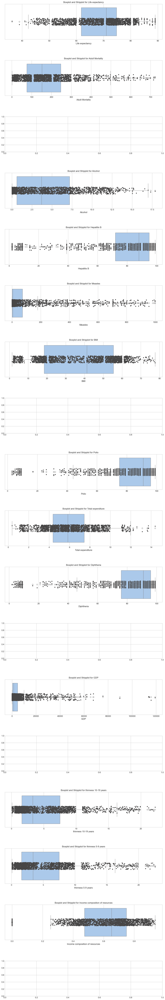

In [31]:
fig,axes = plt.subplots(len(Num_col)-1,1,figsize = (15,5*len(Num_col)))
fig.subplots_adjust(hspace=.6)
axes.flatten()
for i, col in enumerate(Num_col[1:]):
    if df[col].dtype in ("int64", "float64"):
        sns.boxplot(x=col, data=df, ax=axes[i])
        sns.stripplot(x=col, data=df, color="#474646", ax=axes[i])
        axes[i].set_title(f"Boxplot and Stripplot for {col}")
        axes[i].set_xlabel(col)

In [32]:
outlier_data = {}
for col in Num_col[1:]:
    Q1 = df[col].quantile(.25)
    Q3 = df[col].quantile(.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound) ]
    num_outliers = outliers.shape[0]
    total = df[col].count()
    percentage_outliers = round(((num_outliers / total) * 100) , 2)
    outlier_data[col] = percentage_outliers
    print(f"Number of outliers for \033[1m{col} ({round(lower_bound,2)} , {round(upper_bound,2)}) with skeweness {round(df[col].skew(),2)}\033[0m is \033[1m{num_outliers}\033[0m and percentage is \033[1m{percentage_outliers}\033[0m")

Number of outliers for Life expectancy (42.3 , 94.3) with skeweness -0.53 is 4 and percentage is 0.19
Number of outliers for Adult Mortality (-181.12 , 503.88) with skeweness 1.13 is 54 and percentage is 2.6
Number of outliers for infant deaths (-30.5 , 53.5) with skeweness 6.08 is 214 and percentage is 10.29
Number of outliers for Alcohol (-9.3 , 17.1) with skeweness 0.69 is 2 and percentage is 0.1
Number of outliers for Hepatitis B (37.5 , 129.5) with skeweness -1.67 is 225 and percentage is 10.82
Number of outliers for Measles (-109.5 , 182.5) with skeweness 2.62 is 354 and percentage is 17.02
Number of outliers for BMI (-36.85 , 110.75) with skeweness -0.14 is 0 and percentage is 0.0
Number of outliers for under-five deaths (-39.5 , 68.5) with skeweness 6.53 is 267 and percentage is 12.84
Number of outliers for Polio (43.5 , 127.5) with skeweness -1.92 is 174 and percentage is 8.37
Number of outliers for Total expenditure (-0.22 , 12.03) with skeweness 0.23 is 10 and percentage is 

**Negative Q1 because columns have High skewness(as right making Q3 is very high then IQR is high) , so we can"t remove outliers with `IQR`**<br>
**There is a sol is to use `max(lower_bound, 0)` but it can lead to `bias` in analytics**

In [33]:
outlier_data = {}
for col in Num_col[1:]:
    Q1 = df[col].quantile(0.25, interpolation="midpoint")
    Q3 = df[col].quantile(0.75, interpolation="midpoint")
    IQR = Q3 - Q1    
    lower_bound = max(Q1 - 1.5 * IQR, df[col].min())
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    num_outliers = outliers.shape[0]
    total = df[col].count()
    percentage_outliers = round((num_outliers / total) * 100, 2)    
    outlier_data[col] = percentage_outliers
    print(f"Number of outliers for \033[1m{col} ({round(lower_bound,2)} , {round(upper_bound,2)}) with skeweness {round(df[col].skew(),2)}\033[0m is \033[1m{num_outliers}\033[0m and percentage is \033[1m{percentage_outliers}\033[0m")

Number of outliers for Life expectancy (42.3 , 94.3) with skeweness -0.53 is 4 and percentage is 0.19
Number of outliers for Adult Mortality (1.0 , 504.25) with skeweness 1.13 is 54 and percentage is 2.6
Number of outliers for infant deaths (0 , 53.5) with skeweness 6.08 is 214 and percentage is 10.29
Number of outliers for Alcohol (0.01 , 17.1) with skeweness 0.69 is 2 and percentage is 0.1
Number of outliers for Hepatitis B (37.5 , 129.5) with skeweness -1.67 is 225 and percentage is 10.82
Number of outliers for Measles (0.0 , 182.5) with skeweness 2.62 is 354 and percentage is 17.02
Number of outliers for BMI (1.4 , 110.75) with skeweness -0.14 is 0 and percentage is 0.0
Number of outliers for under-five deaths (0 , 68.5) with skeweness 6.53 is 267 and percentage is 12.84
Number of outliers for Polio (43.5 , 127.5) with skeweness -1.92 is 174 and percentage is 8.37
Number of outliers for Total expenditure (0.37 , 12.04) with skeweness 0.23 is 10 and percentage is 0.48
Number of outl

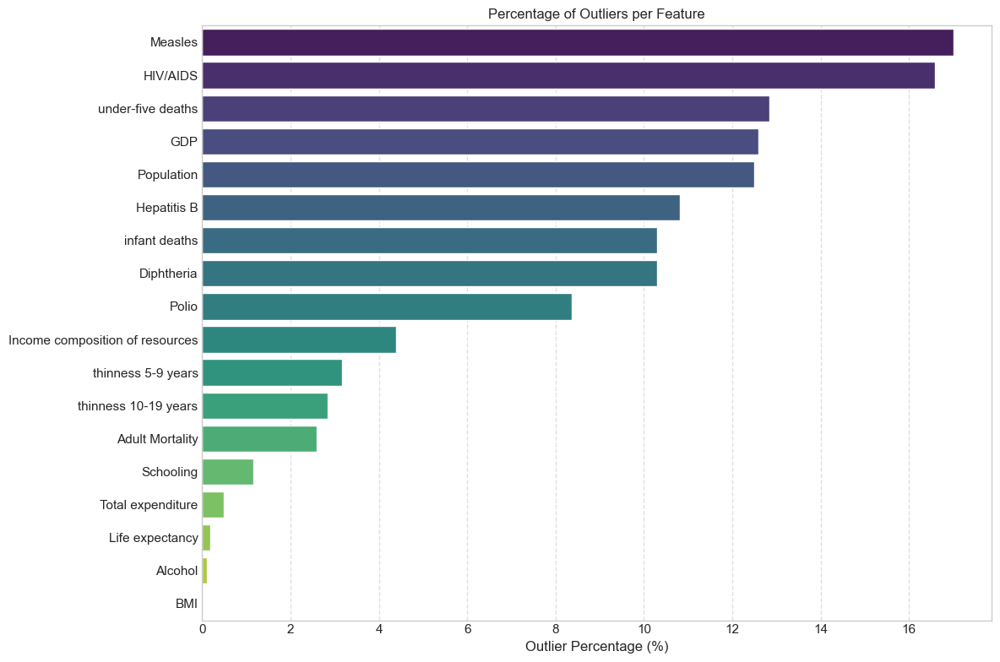

In [34]:
outlier_df = pd.DataFrame(list(outlier_data.items()), columns=["Feature", "Outlier_Percentage"])
outlier_df = outlier_df.sort_values(by="Outlier_Percentage", ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=outlier_df, x="Outlier_Percentage", y="Feature", palette="viridis")
plt.title("Percentage of Outliers per Feature")
plt.xlabel("Outlier Percentage (%)")
plt.ylabel("")
plt.grid(axis="x", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

## Handling Outliers

`**"Life expectancy"**`: Only `**0.23%**` of values are outliers , Removing them may `have no significant benefit` but can reduce data size unnecessarily
**Life expectancy extremes (very low or very high) may reflect actual situations in certain countries or years.<br>**
**Deleting them could mean `losing valuable insights`**

**There are a number of ways to deal with outliers:**
- Drop Outliers (best avoided in order to keep as much information as possible)
- Limit values to upper and/or lower bounds (Winsorize the data)
- Transform the data (log/inverse/square root)

**I choose a way that can limit the effect of the values (winsorization), without removing it(keeps the number of rows)**

In [35]:
def plot_BA_outliers(df, col_name, lower, upper):
    plt.figure(figsize=(8, 5))

    plt.subplot(1, 2, 1)
    plt.boxplot(df[col_name])
    plt.title(f"Original {col_name} boxplot")
    plt.xticks([])

    winsorized_col = winsorize(df[col_name], limits=(lower, upper))
    plt.subplot(1, 2, 2)
    plt.boxplot(winsorized_col)
    plt.title(f"Winsorized {col_name}")
    plt.xticks([])
    df[col_name] = winsorized_col
    
    plt.tight_layout()
    plt.show()
    return df[col_name]

In [36]:
df["Adult Mortality"].min(),df["Adult Mortality"].max()

(1.0, 723.0)

In [37]:
lower_threshold = df["Adult Mortality"].quantile(0.05)
lower_threshold

13.0

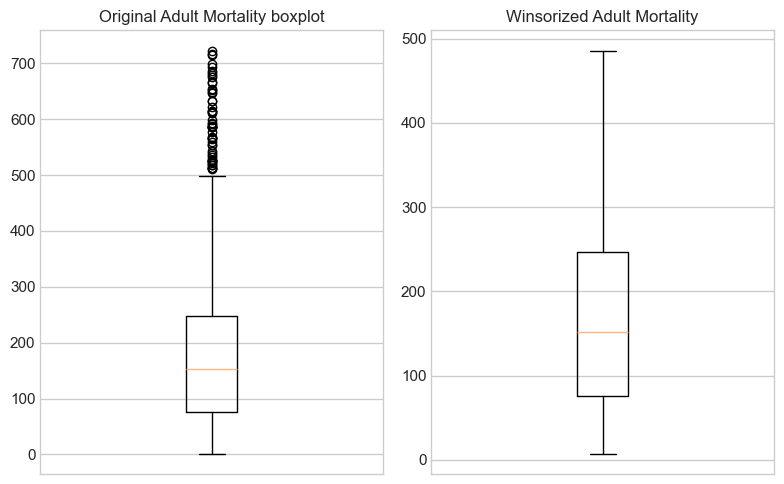

In [38]:
plot_BA_outliers(df,"Adult Mortality",.02,.03);

-----

In [39]:
df["infant deaths"].min(),df["infant deaths"].max()

(0, 576)

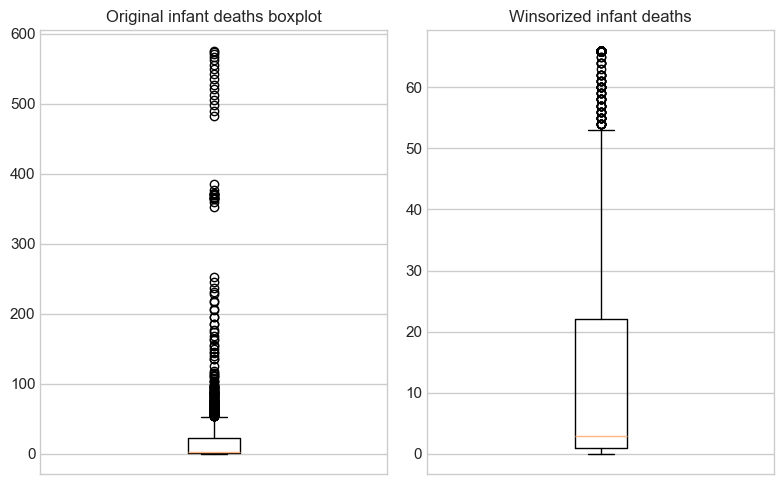

In [40]:
plot_BA_outliers(df,"infant deaths",0,.0675);

----

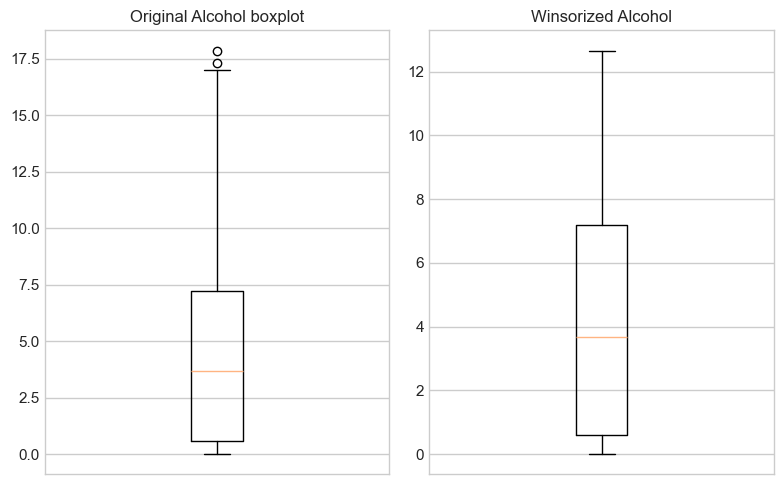

In [41]:
plot_BA_outliers(df,"Alcohol",0,.026);

-------

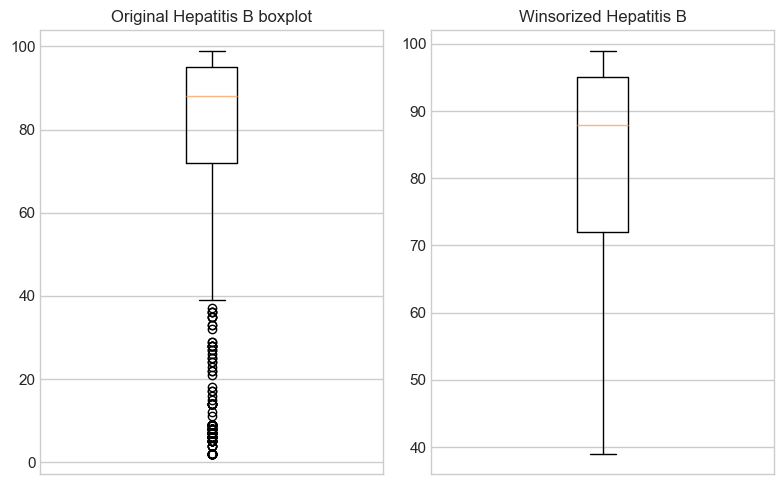

In [42]:
plot_BA_outliers(df,"Hepatitis B",.11,0);

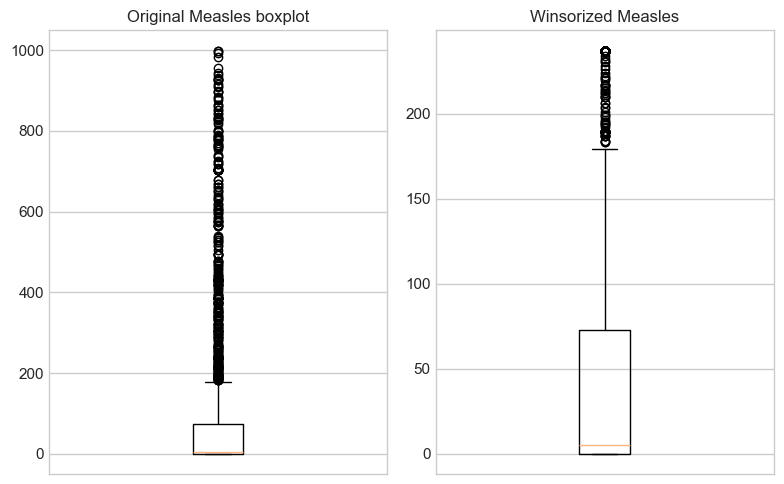

In [43]:
plot_BA_outliers(df,"Measles",0,.132);

---

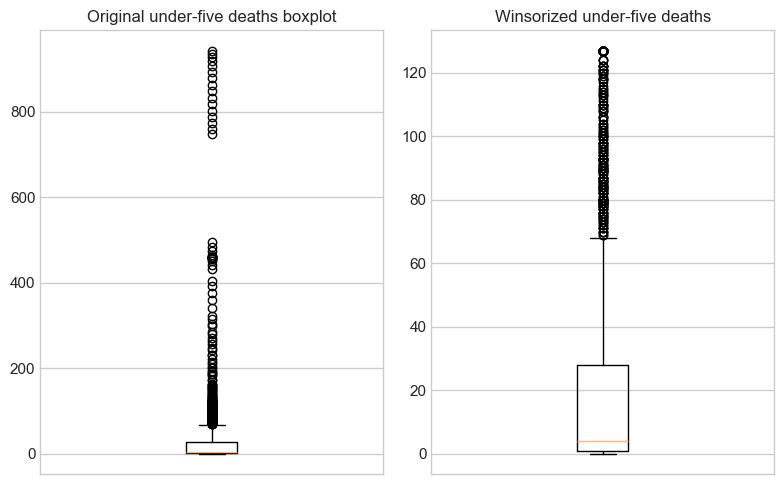

In [44]:
plot_BA_outliers(df,"under-five deaths",0,.04);

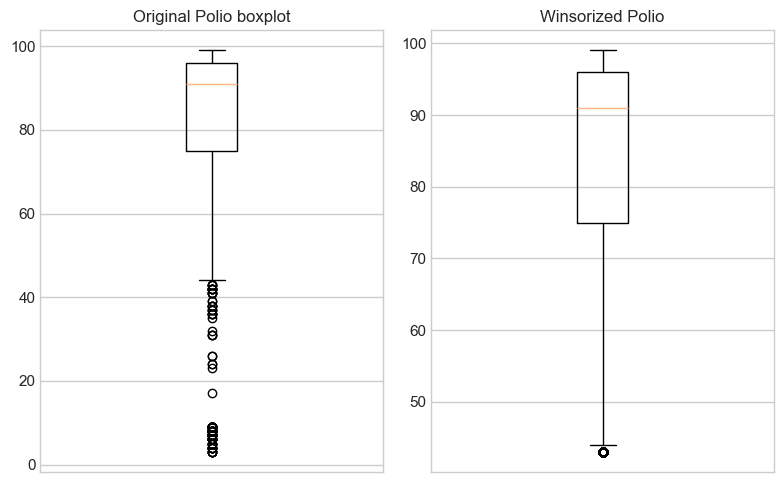

In [45]:
plot_BA_outliers(df,"Polio",.082,0);

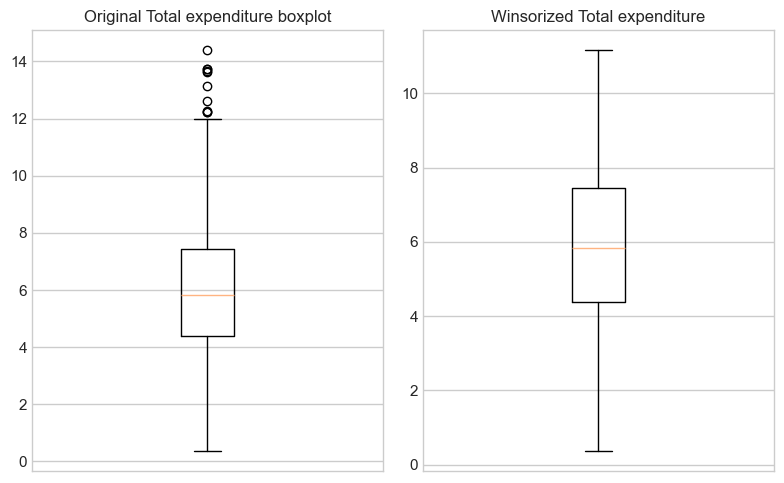

In [46]:
plot_BA_outliers(df,"Total expenditure",0,.027);

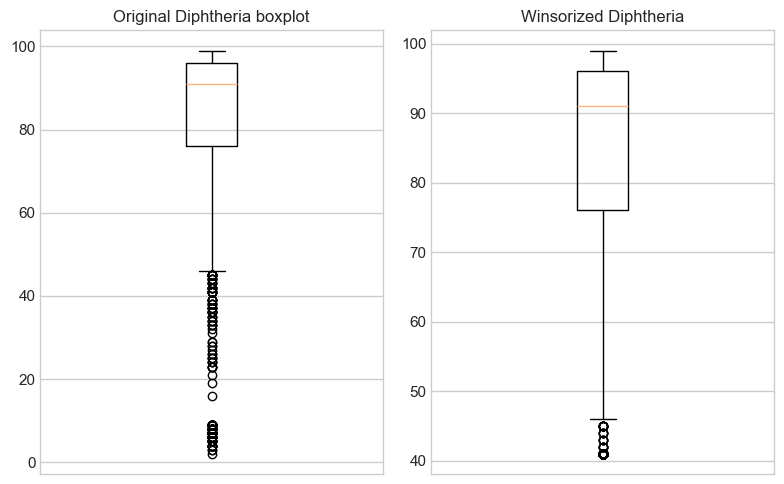

In [47]:
plot_BA_outliers(df,"Diphtheria",.088,0);

In [48]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness 10-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

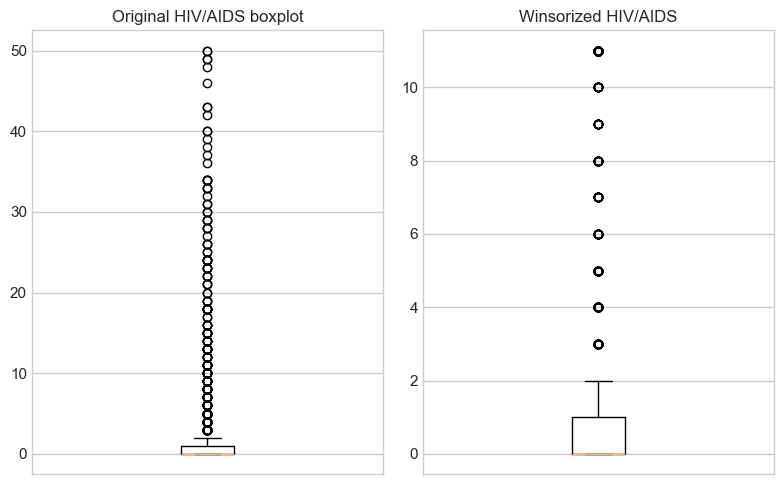

In [49]:
plot_BA_outliers(df,"HIV/AIDS",.05,.05);

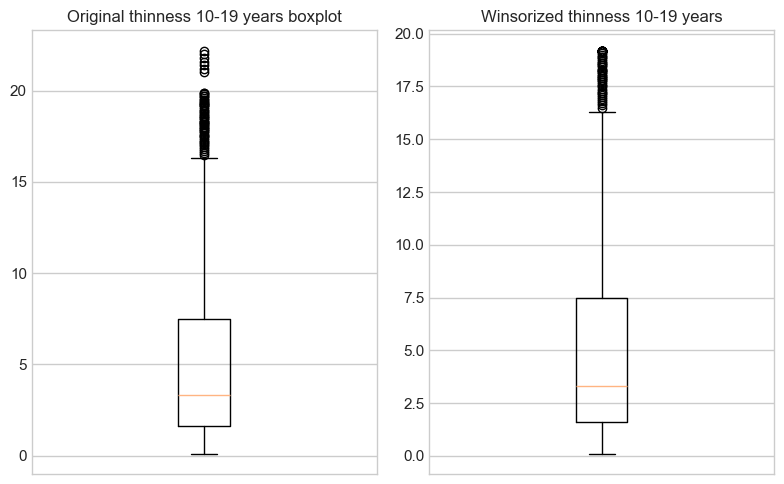

In [50]:
plot_BA_outliers(df,"thinness 10-19 years",.0,.01);

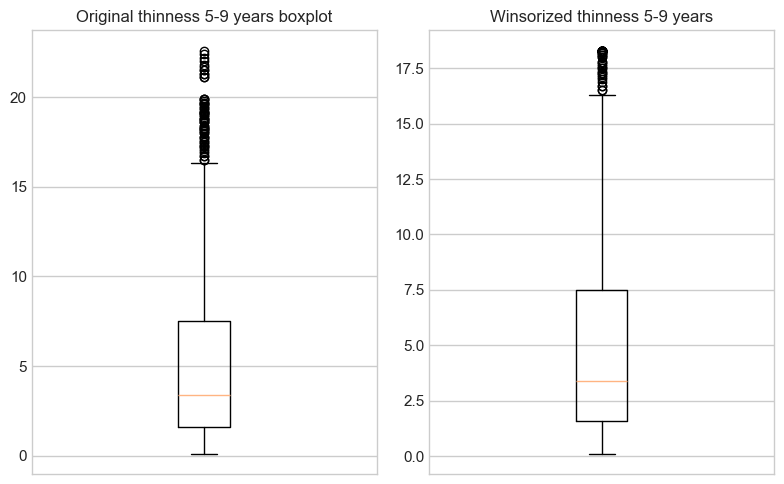

In [51]:
plot_BA_outliers(df,"thinness 5-9 years",.0,.02);

----

## Checking outliers after handling it

In [52]:
outlier_data = {}
for col in Num_col[1:]:
    Q1 = df[col].quantile(.25)
    Q3 = df[col].quantile(.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound) ]
    num_outliers = outliers.shape[0]
    total = df[col].count()
    percentage_outliers = round(((num_outliers / total) * 100) , 2)
    outlier_data[col] = percentage_outliers
    print(f"Number of outliers for \033[1m{col} ({round(lower_bound,2)} , {round(upper_bound,2)})\033[0m is \033[1m{num_outliers}\033[0m and percentage is \033[1m{percentage_outliers}\033[0m")


Number of outliers for Life expectancy (42.3 , 94.3) is 4 and percentage is 0.19
Number of outliers for Adult Mortality (-181.12 , 503.88) is 0 and percentage is 0.0
Number of outliers for infant deaths (-30.5 , 53.5) is 214 and percentage is 10.29
Number of outliers for Alcohol (-9.3 , 17.1) is 0 and percentage is 0.0
Number of outliers for Hepatitis B (37.5 , 129.5) is 0 and percentage is 0.0
Number of outliers for Measles (-109.5 , 182.5) is 354 and percentage is 17.02
Number of outliers for BMI (-36.85 , 110.75) is 0 and percentage is 0.0
Number of outliers for under-five deaths (-39.5 , 68.5) is 267 and percentage is 12.84
Number of outliers for Polio (43.5 , 127.5) is 174 and percentage is 8.37
Number of outliers for Total expenditure (-0.22 , 12.03) is 0 and percentage is 0.0
Number of outliers for Diphtheria (46.0 , 126.0) is 214 and percentage is 10.29
Number of outliers for HIV/AIDS (-1.5 , 2.5) is 345 and percentage is 16.59
Number of outliers for GDP (-5912.42 , 10901.55) i

**This is better than before😊**

---

## Duplicated Values

In [53]:
print("Number of duplicated values: ", df.duplicated().sum())

Number of duplicated values:  0


**The data has no duplicates**

---

## Univariate Analysis

### Handling Categorical Columns

**View `Country` Column**

In [54]:
df["Country"].value_counts()

Country
Afghanistan          16
Romania              16
Poland               16
Philippines          16
Peru                 16
                     ..
Eritrea              16
Equatorial Guinea    16
El Salvador          16
Ecuador              16
Zimbabwe             16
Name: count, Length: 130, dtype: int64

**This dataset contain data of 130 Countries**

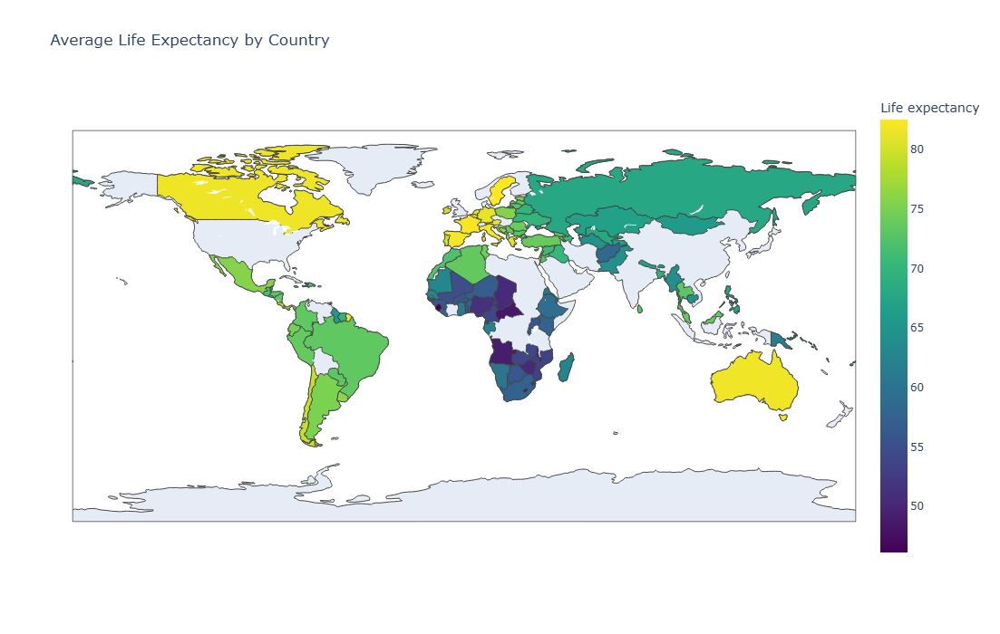

In [55]:
life_exp = df.groupby("Country")["Life expectancy"].mean().reset_index()
fig = px.choropleth(
    life_exp,
    locations="Country",
    locationmode="country names",
    color="Life expectancy",
    color_continuous_scale="Viridis",
    title="Average Life Expectancy by Country"
)

fig.update_layout(width=1000, height=700)
fig.show()

In [56]:
df["Status"].unique()

array(['Developing', 'Developed'], dtype=object)

###  Types of Countries 🌍

- **Developed Countries**: High-income or industrialized countries  
- **Developing Countries**: Low- and middle-income countries


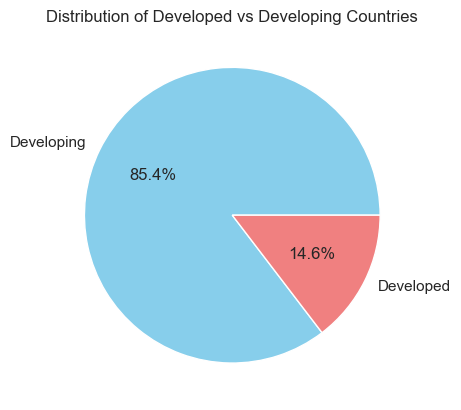

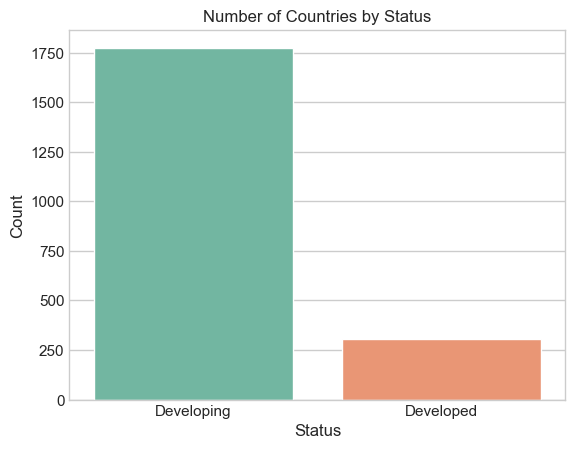

In [57]:
Status = df["Status"].value_counts()
Status.plot(kind = "pie" , autopct="%1.1f%%" , colors=["skyblue", "lightcoral"])
plt.title("Distribution of Developed vs Developing Countries")
plt.ylabel("") 
plt.show()
sns.countplot(data=df, x="Status", palette="Set2")
plt.title("Number of Countries by Status")
plt.xlabel("Status")
plt.ylabel("Count")
plt.show()

**There is an `imbalance problem` in the label column**

---------

### Handling Numrical Columns

**Display the data timeframe**

In [58]:
df["Year"].value_counts().sort_index()

Year
2000    130
2001    130
2002    130
2003    130
2004    130
2005    130
2006    130
2007    130
2008    130
2009    130
2010    130
2011    130
2012    130
2013    130
2014    130
2015    130
Name: count, dtype: int64

**The dataset contain data from 2000 to 2015**

---

**Display the `Life Expextancy` Column**

In [59]:
df[df["Life expectancy"] <= 0]

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling


**As Expected No one has Life Expectancy less or equal to zero**

In [60]:
df["Life expectancy"].describe()

count    2080.000000
mean       68.118029
std         9.700716
min        36.300000
25%        61.800000
50%        71.000000
75%        74.800000
max        89.000000
Name: Life expectancy, dtype: float64

### Insights:

- **Mean Life Expectancy** is **63.71 years**, showing a global average slightly below 65.
- **Median (64.3 years)** is higher than the mean, indicating a **left (negative) skew**
- **Standard Deviation (9.28)** shows a **moderately wide spread**, meaning there"s significant variation in life expectancy across countries and years.
- **Minimum (36.3)** and **Maximum (89.0)** show a huge gap between countries with the **lowest and highest** life expectancies.
- The interquartile range (**Q3 - Q1 = 71.78 - 57.2 = 14**) further supports that life expectancy varies considerably between countries.

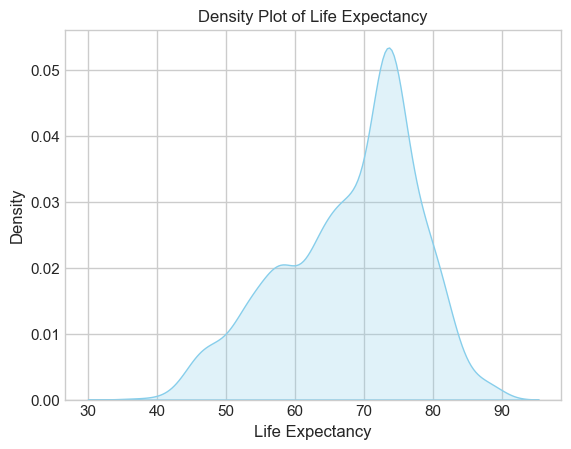

In [61]:
sns.kdeplot(df["Life expectancy"], shade=True, color="skyblue")
plt.title("Density Plot of Life Expectancy")
plt.xlabel("Life Expectancy")
plt.show()

In [62]:
print(f"Skewness: {df["Life expectancy"].skew():.2f}")

Skewness: -0.53


### Life Expectancy Analysis

- **Most Common Life Expectancy**:  
  The highest peak of the curve is centered around63*67–75 years**.  
  This indicates that the most frequent life expectancy falls within this range.

- **Skewness**:  
  A skewness value between **-0+.5 and -1** indicatnear to zero (nearly normal)ve skew**.  
  The distribution is not perfectly symmetrical, but it"s not extremely skewed either.  
  This suggests that **most countries in the dataset have a higher life expectancy**.

- **Shape of the Distribution**:
  - A **major, sharp peak63 67ound **73–75 years**
  - A **smaller, broader pea73*75round **55–60 years**


---

In [63]:
df["Adult Mortality"].describe()

count    2080.000000
mean      172.534135
std       121.740409
min         7.000000
25%        75.750000
50%       152.000000
75%       247.000000
max       486.000000
Name: Adult Mortality, dtype: float64

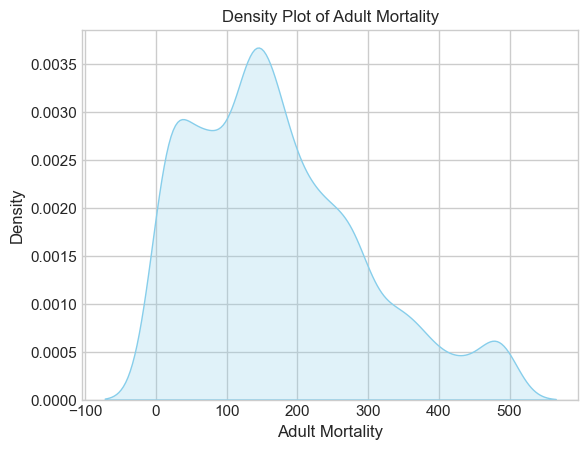

In [64]:
sns.kdeplot(df["Adult Mortality"], shade=True, color="skyblue")
plt.title("Density Plot of Adult Mortality")
plt.xlabel("Adult Mortality")
plt.show()

In [65]:
print(f"Skewness: {df["Adult Mortality"].skew():.2f}")

Skewness: 0.75


 **adult mortality** is **Moderate right skew**,  
The majority of values are clustered `toward the left` (lower values)

---

In [66]:
df["infant deaths"].describe()

count    2080.000000
mean       14.634615
std        20.653656
min         0.000000
25%         1.000000
50%         3.000000
75%        22.000000
max        66.000000
Name: infant deaths, dtype: float64

**there are about 23 infant deaths per 1000 person**<br>
**std = 27.13 indicates High spread in the data**

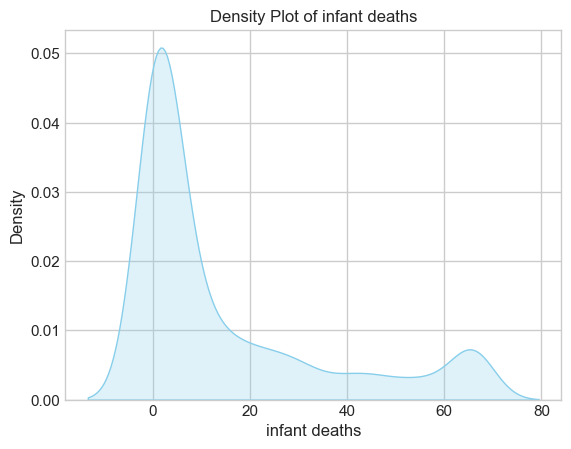

In [67]:
sns.kdeplot(df["infant deaths"], shade=True, color="skyblue")
plt.title("Density Plot of infant deaths")
plt.xlabel("infant deaths")
plt.show()

In [68]:
df["infant deaths"].skew()

1.462368994315109

**positively skewed (right-skewed)**

---

In [69]:
df["Alcohol"].describe()

count    2080.000000
mean        4.362974
std         3.931395
min         0.010000
25%         0.600000
50%         3.690000
75%         7.200000
max        12.660000
Name: Alcohol, dtype: float64

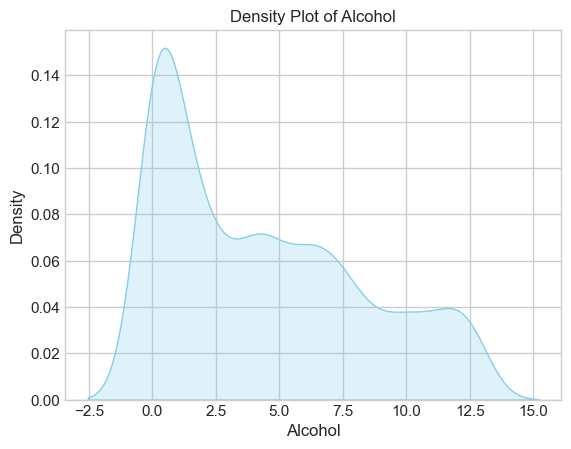

In [70]:
sns.kdeplot(df["Alcohol"], shade=True, color="skyblue")
plt.title("Density Plot of Alcohol")
plt.xlabel("Alcohol")
plt.show()

----

In [71]:
df["Hepatitis B"].describe()

count    2080.000000
mean       80.505769
std        19.581945
min        39.000000
25%        72.000000
50%        88.000000
75%        95.000000
max        99.000000
Name: Hepatitis B, dtype: float64

**According to `Mean = 76.93` and `median = 84` : Most countries have strong vaccination programs .<br>**
**`75th percentile = 94%`: Many achieve near-universal coverage.**

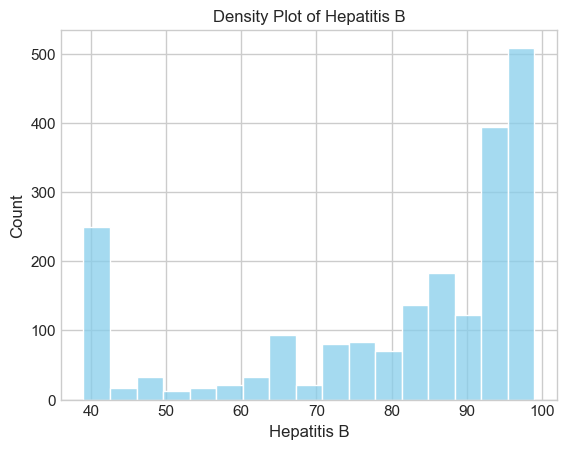

In [72]:
sns.histplot(df["Hepatitis B"],  color="skyblue")
plt.title("Density Plot of Hepatitis B")
plt.xlabel("Hepatitis B")
plt.show()

-----

In [73]:
print(df["Measles"].describe())

count    2080.000000
mean       55.375000
std        85.990496
min         0.000000
25%         0.000000
50%         5.000000
75%        73.000000
max       237.000000
Name: Measles, dtype: float64


**the `mean` is much higher than the `median`, this suggests a few very large values <br>**
**Many zeros: At least `25%` of the data has `zero` cases.<br>**

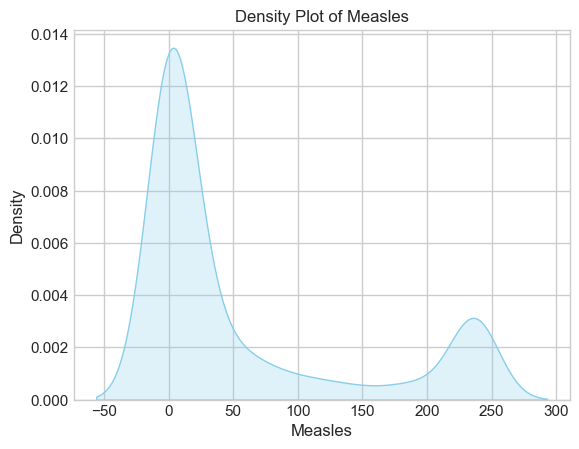

In [74]:
sns.kdeplot(df["Measles"], shade=True, color="skyblue")
plt.title("Density Plot of Measles")
plt.xlabel("Measles")
plt.show()

**`long right tail` as mean is much bigger than median**

---

In [75]:
print(df["BMI"].describe())

count    2080.000000
mean       37.103654
std        19.853129
min         1.400000
25%        18.500000
50%        41.300000
75%        55.400000
max        77.600000
Name: BMI, dtype: float64


**The average `BMI is 29.93` which is considered `obese` according to standard BMI categories.<br>
`Standard deviation is quite high` suggesting a wide `spread` in BMI values.<br>
`25%` of people have a BMI less than or equal to 16.5 ---> (this is considered normal).<br>
`Max` BMI is `77.6` is very high it can be possible but rare.<br>
Standard Normal BMI from 18.5 - 24.9**

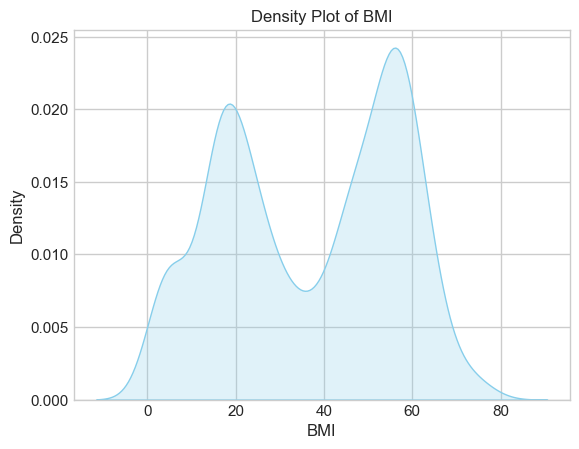

In [76]:
sns.kdeplot(df["BMI"], shade=True, color="skyblue")
plt.title("Density Plot of BMI")
plt.xlabel("BMI")
plt.show()

**There are two peaks:<br>
        1 - around 18 ( within the healthy BMI range)<br>
        2 - around 55 - 60 (high)<br>**

---

In [77]:
df["under-five deaths"].describe()

count    2080.000000
mean       22.666346
std        35.340836
min         0.000000
25%         1.000000
50%         4.000000
75%        28.000000
max       127.000000
Name: under-five deaths, dtype: float64

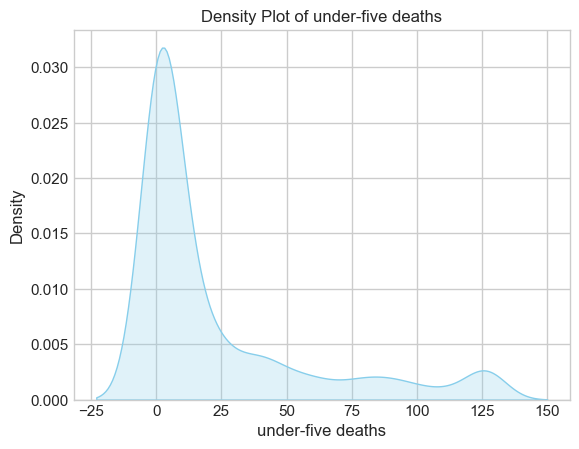

In [78]:
sns.kdeplot(df["under-five deaths"], shade=True, color="skyblue")
plt.title("Density Plot of under-five deaths")
plt.xlabel("under-five deaths")
plt.show()

`**under-five deaths**` : the **mean** is **39.34** and **median** is **15** → it is **right skewed**  
                        **std** is **54** → indicates **high spread** in dataset  


---

In [79]:
df["Polio"].describe()

count    2080.000000
mean       83.142788
std        17.655522
min        43.000000
25%        75.000000
50%        91.000000
75%        96.000000
max        99.000000
Name: Polio, dtype: float64

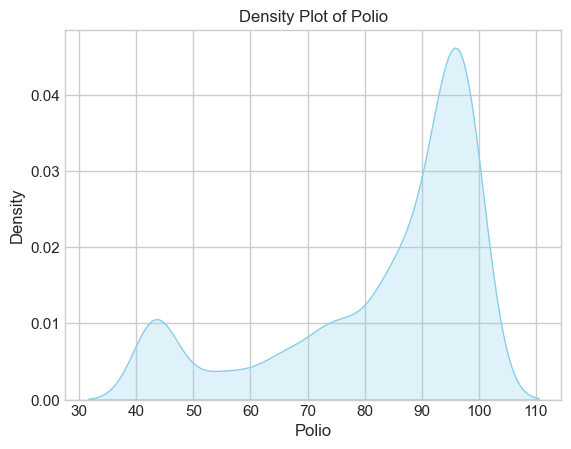

In [80]:
sns.kdeplot(df["Polio"].dropna(), shade=True, color="skyblue")
plt.title("Density Plot of Polio")
plt.xlabel("Polio")
plt.show()

**`Polio` : most of the countries have `high Polio vaccination` this lead to `right-skewed distribution`.<br>
        While most countries have high Polio vaccination rates some still have `low coverage` indicating inequality in healthcare access.<br>
        `std` is 22.58 there is a `moderate spread` in the data.<br>
        max value is 99 % nearly full coverage.<br>**

-----

In [81]:
df["Total expenditure"].describe()

count    2080.000000
mean        5.925788
std         2.263573
min         0.370000
25%         4.377500
50%         5.830000
75%         7.440000
max        11.160000
Name: Total expenditure, dtype: float64

In [82]:
most_common = df["Total expenditure"].value_counts()
value = most_common.index[0]
count = most_common.iloc[0]
print(f"The most common total expenditure value is {value} with {count}")

The most common total expenditure value is 11.16 with 57


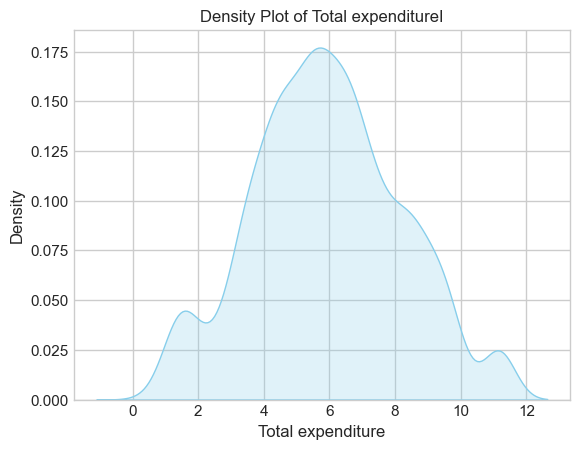

In [83]:
sns.kdeplot(df["Total expenditure"], shade=True, color="skyblue")
plt.title("Density Plot of Total expenditureI")
plt.xlabel("Total expenditure")
plt.show()

**Total expenditure: On average, 5.45% of government budgets go to health.<br>
Half of the countries spend less than 5.41% <br>
there is some variation, but not extreme <br>
min is 37 % some countries spend nothing on the health <br>
Mean (5.45%) > Median (5.41%) ---> this suggests a slight right skew. <br>
The range (9.98 − 0.37 = 9.61%) is wide, meaning spending priorities vary by country.<br>**

---

In [84]:
df["Diphtheria"].describe()

count    2080.000000
mean       83.112981
std        18.070814
min        41.000000
25%        76.000000
50%        91.000000
75%        96.000000
max        99.000000
Name: Diphtheria, dtype: float64

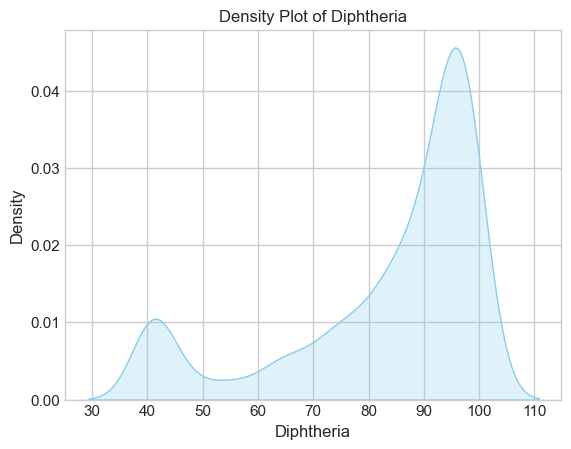

In [85]:
sns.kdeplot(df["Diphtheria"].dropna(), shade=True, color="skyblue")
plt.title("Density Plot of Diphtheria")
plt.xlabel("Diphtheria")
plt.show()

In [86]:
print(df["Diphtheria"].skew())

-1.304509207717694


**`Diphtheria` is `negatively skewed`. This indicates that while the majority of the values are high<br>
there are a number of very low values that are pulling the average down<br>
there are two peaks:<br>
1-the primary one around from 90 - 95 (High vaccination)<br>
2-the second one around from 21 - 24 (Low vaccination)<br>**

----

In [87]:
df["HIV/AIDS"].describe()

count    2080.000000
mean        1.337019
std         2.911947
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max        11.000000
Name: HIV/AIDS, dtype: float64

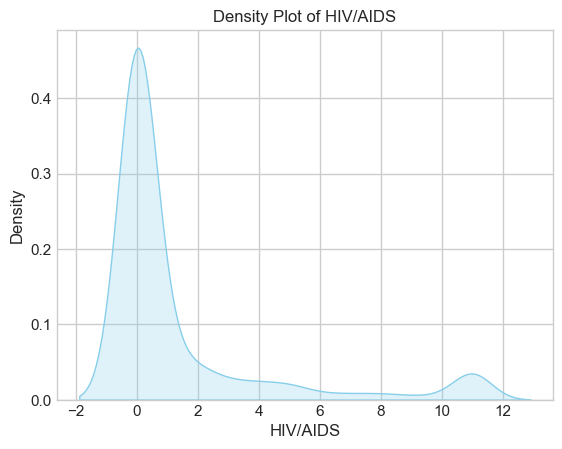

In [88]:
sns.kdeplot(df["HIV/AIDS"].dropna(), shade=True, color="skyblue")
plt.title("Density Plot of HIV/AIDS")
plt.xlabel("HIV/AIDS")
plt.show()


**Mean (1.33) > Median (0) ---> Strong indication of right-skewed distribution (a few high values pulling the average up).<br>
Std Dev = 2.9 is large compared to the mean (1.74) ---> highly spread distribution.**

----

`GDP` ----> **Gross Domestic Product**

In [89]:
df["GDP"].describe()

count      2080.000000
mean       5489.762738
std       11489.198199
min           1.681350
25%         392.820273
50%        1361.865630
75%        4596.312242
max      119172.741800
Name: GDP, dtype: float64

In [90]:
df[df["GDP"] == df["GDP"].min()]

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling
2036,Philippines,2002,Developing,66.8,221.0,66,4.42,42.0,9.0,18.7,...,77.0,2.79,79.0,0,1.68135,813526,1.0,9.7,0.625,11


In [91]:
df = df[df["GDP"] >= 100]

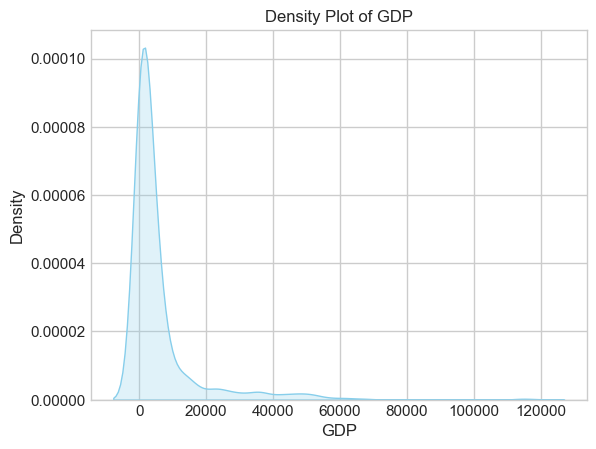

In [92]:
sns.kdeplot(df["GDP"].dropna(), shade=True, color="skyblue")
plt.title("Density Plot of GDP")
plt.xlabel("GDP")
plt.show()

**Most of the Countries have `low GDP` while there are some countries have `high GDP` and this is obvious from the max GDP<br>
`std is 11862` this is approximately the double of the mean ---> High Variability**

------

In [93]:
print(f"min of population is {df["Population"].min()}")


min of population is 34


In [94]:
df[df["Population"] == 34.0][["Country","Year"]]

,Country,Year
1614,Maldives,2003


-----

In [95]:
df["thinness 10-19 years"].describe()

count    1913.000000
mean        4.832305
std         4.302455
min         0.100000
25%         1.500000
50%         3.100000
75%         7.300000
max        19.200000
Name: thinness 10-19 years, dtype: float64

**Most values are at the `lower end` (50 % of the data are below 3.1 %).<br>
The wide range from `.1 to 19.2` show that there is a `big variation`**

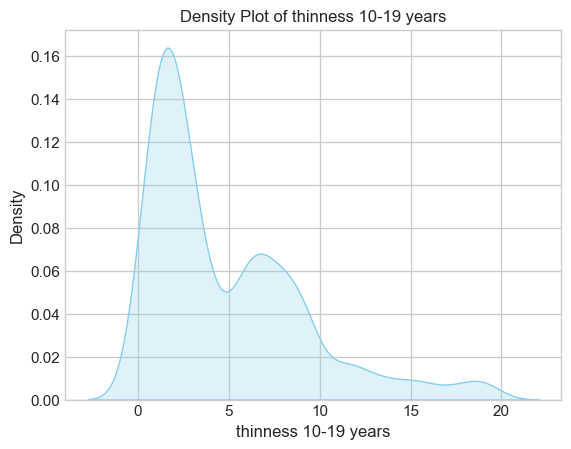

In [96]:
sns.kdeplot(df["thinness 10-19 years"], shade=True, color="skyblue")
plt.title("Density Plot of thinness 10-19 years")
plt.xlabel("thinness 10-19 years")
plt.show()

------------

In [97]:
df["thinness 5-9 years"].describe()

count    1913.000000
mean        4.841296
std         4.265378
min         0.100000
25%         1.600000
50%         3.200000
75%         7.300000
max        18.300000
Name: thinness 5-9 years, dtype: float64

**Most values are at the `lower end` (50 % of the data are below 3.2 %).<br>
The wide range from `.1 to 18.3` show that there is a `big variation`**

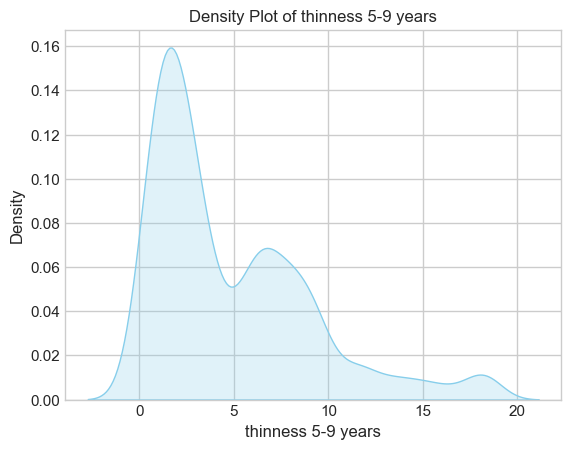

In [98]:
sns.kdeplot(df["thinness 5-9 years"].dropna(), shade=True, color="skyblue")
plt.title("Density Plot of thinness 5-9 years")
plt.xlabel("thinness 5-9 years")
plt.show()

**Approximately it is the same distribution of `"thinness  1-19 years"`**

-----

In [99]:
df["Income composition of resources"].describe()

count    1913.000000
mean        0.618592
std         0.204232
min         0.000000
25%         0.490000
50%         0.668000
75%         0.756000
max         0.937000
Name: Income composition of resources, dtype: float64

**the min is 0 this can be data entry error or lack of resources<br>
while most of countries have high Income Composition Of Resources there are some countries have low or don"t have**

In [100]:
df = df[df["Income composition of resources"] >= .25]

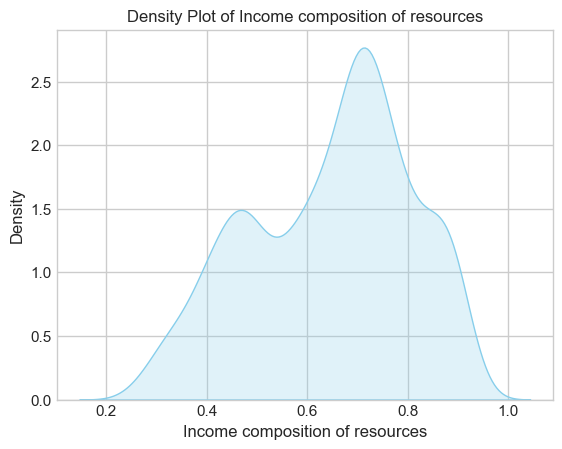

In [101]:
sns.kdeplot(df["Income composition of resources"].dropna(), shade=True, color="skyblue")
plt.title("Density Plot of Income composition of resources")
plt.xlabel("Income composition of resources")
plt.show()

**There are Two Peaks<br>
1 - low income group : A larger group exist within .45<br>
2 - High income group : The largest and widest peak is centered around 0.75**

----

In [102]:
df["Schooling"].describe()

count    1831.000000
mean       11.584926
std         3.096847
min         2.000000
25%        10.000000
50%        12.000000
75%        14.000000
max        20.000000
Name: Schooling, dtype: float64

**`std = 3.35` indicates high variation between countries in school years<br>
`Median` is slightly higher than `the mean` which indicates slightly `left skew` in the distribution**

---

# Bivariate Analysis

- **`life expectancy` in developed and developing countries over time**

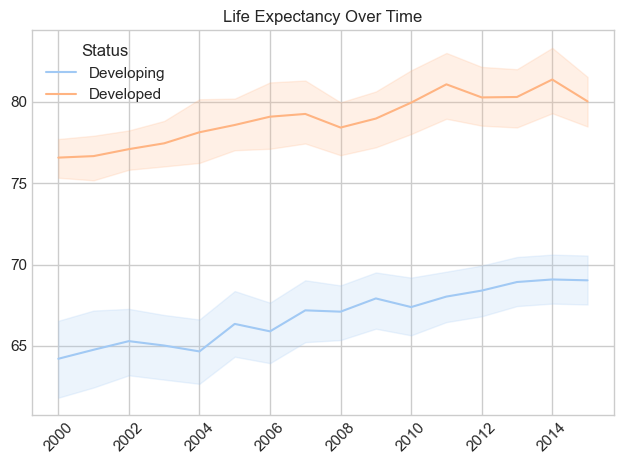

In [103]:
sns.lineplot(data=df, x="Year", y="Life expectancy", hue="Status")
plt.title("Life Expectancy Over Time")
plt.xticks(rotation=45)
plt.xlabel("")
plt.ylabel("")
plt.tight_layout()
plt.show()

- **The Life expectancy increase over the time for both developed and developing countries**<br>
- **The Developed Countries have more Life expectancy than the developed Countries**

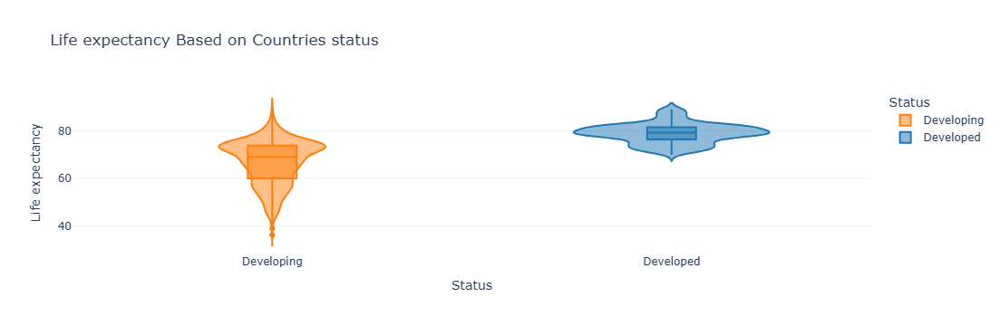

<Figure size 1500x800 with 0 Axes>

In [104]:
fig=px.violin(df,x="Status",y="Life expectancy",color="Status",template="plotly_white"
              ,box=True,title="Life expectancy Based on Countries status"
              ,color_discrete_map={
            "Developed": "#1f77b4",
        "Developing": "#ff7f0e"
    })
plt.figure(figsize=(15,8))
fig.show()

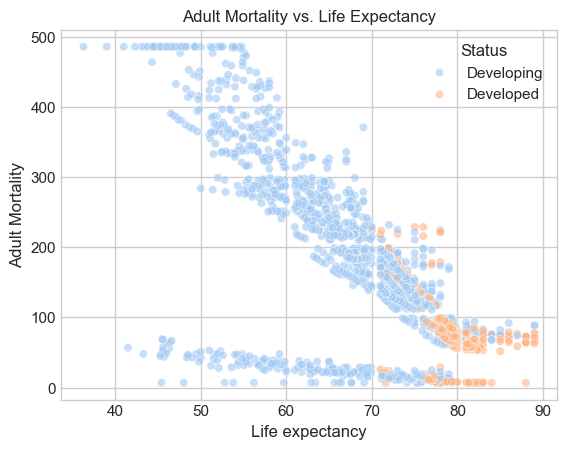

In [105]:
sns.scatterplot(data = df,x = "Life expectancy",y = "Adult Mortality",hue = "Status" ,alpha =.6)
plt.title("Adult Mortality vs. Life Expectancy")
plt.show()

- **There is an `inverse relationship` between `adult mortality` and `life expectancy` As adult mortality decreases, life expectancy generally increases**

----

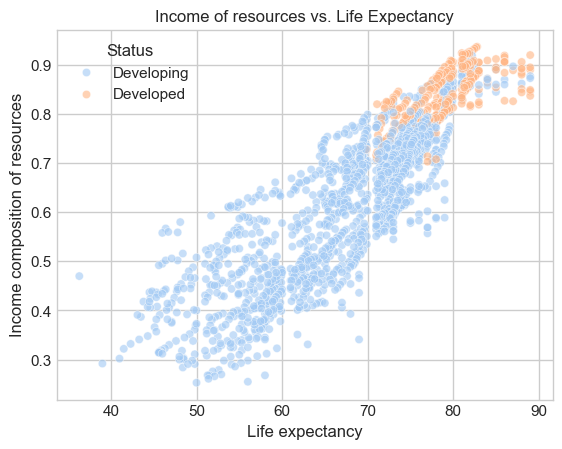

In [106]:
sns.scatterplot(data = df,x = "Life expectancy",y = "Income composition of resources",hue = "Status" ,alpha =.6)
plt.title("Income of resources vs. Life Expectancy")
plt.show()

- **There is a strong positive correlation between `"Income composition of resources"` and `"Life expectancy"`**

----

<Axes: xlabel='Schooling', ylabel='Income composition of resources'>

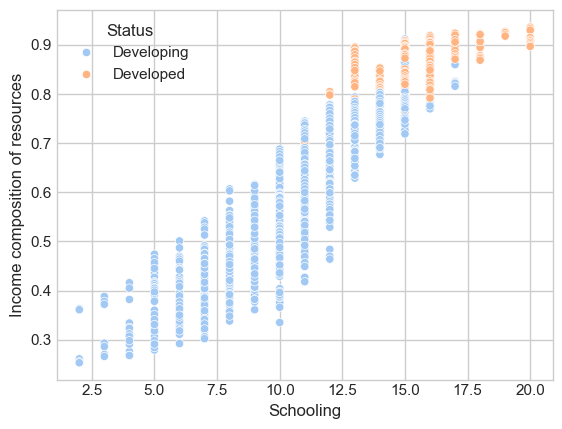

In [107]:
sns.scatterplot(
    data=df,
    x="Schooling",
    y="Income composition of resources",
    hue="Status",
)


 **Strong Positive Correlation between Income Resoucrces and Schooling**

In [108]:
correlation_data = df[[ "Year", "Adult Mortality",
       "infant deaths", "Alcohol", "Hepatitis B",
       "Measles", "BMI", "under-five deaths", "Polio", "Total expenditure",
       "Diphtheria", "HIV/AIDS", "GDP", "Population", "thinness 10-19 years",
       "thinness 5-9 years", "Income composition of resources", "Schooling","Life expectancy"]].corr()["Life expectancy"].sort_values()
correlation_data

HIV/AIDS                          -0.683688
Adult Mortality                   -0.682310
under-five deaths                 -0.559169
infant deaths                     -0.545366
thinness 5-9 years                -0.513128
thinness 10-19 years              -0.509997
Measles                           -0.210503
Population                         0.016430
Year                               0.145483
Total expenditure                  0.213691
Hepatitis B                        0.273894
Alcohol                            0.396577
GDP                                0.445728
Polio                              0.521333
Diphtheria                         0.532862
BMI                                0.589124
Schooling                          0.760169
Income composition of resources    0.875832
Life expectancy                    1.000000
Name: Life expectancy, dtype: float64

<Axes: xlabel='Total expenditure', ylabel='Life expectancy'>

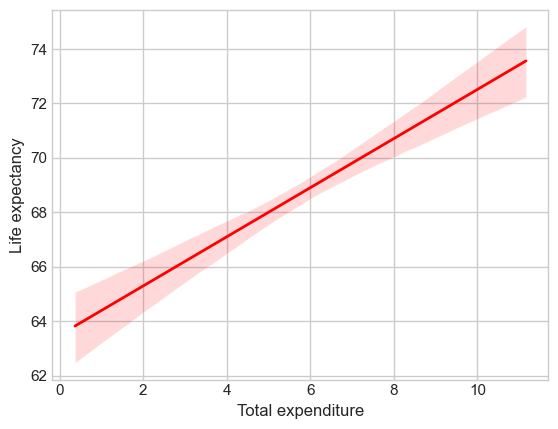

In [109]:
sns.regplot(
    data=df,
    x="Total expenditure",
    y="Life expectancy",
    scatter=False,
    color="red",
    line_kws={"linewidth": 2}
)

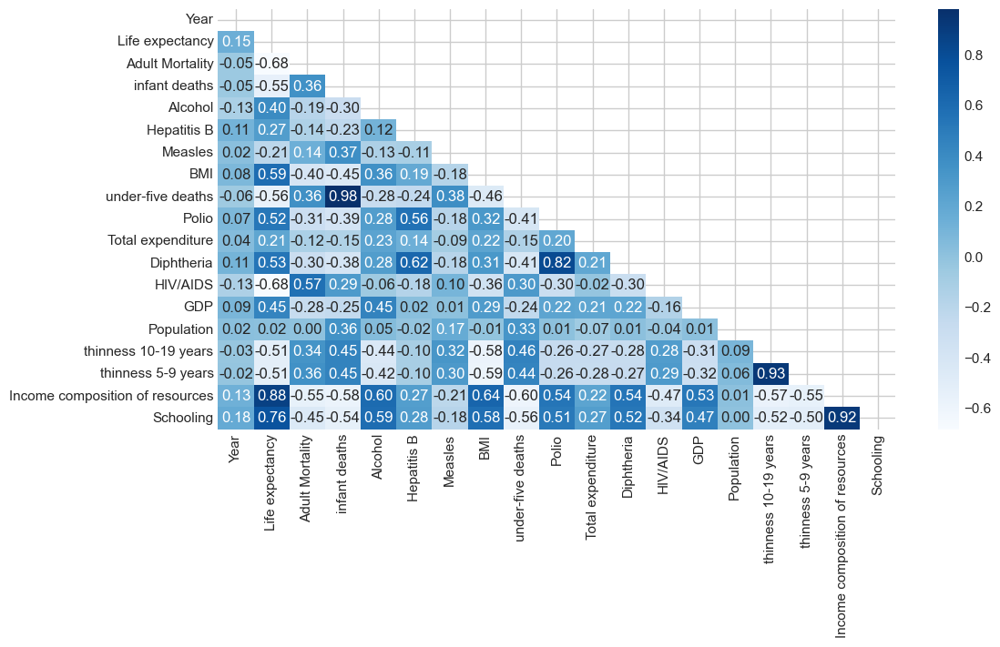

In [110]:
corr = df[Num_col].corr()
mask = np.triu(corr)
plt.figure(figsize=(12, 6))
sns.heatmap(corr, annot=True,mask=mask, cmap="Blues", fmt=".2f")
plt.show()

## Key Findings
- The more income composition, GDP, and years in schooling, the higher the life expectancy.
- The columns **"thinness 10-19 years"** and **"thinness 5-9 years"** have similar distributions. We will choose one for the model.
- The more the country is vaccinated, the higher the life expectancy.
- There is an inverse relationship between BMI and population: the higher the BMI, the lower the population.
- There is a positive correlation between income composition of resources and schooling.
- Since **"under 5 death"** and **"infant death"** are practically the same, we will choose the more generalized column, which is **"under 5 death"**.

## Data Choices for the Model
- Selecting one of the **"thinness 10-19 years"** or **"thinness 5-9 years"** due to similar distributions.
- Choosing **"under 5 death"** as it is a more generalized and relevant column.

## Important Factors Influencing Life Expectancy
- **Income composition of resources** (higher income composition correlates with higher life expectancy).
- **GDP** (higher GDP is often associated with higher life expectancy).
- **Years in schooling** (longer education contributes to better life expectancy).
- **Vaccination rates** (higher vaccination rates contribute to better life expectancy).
- **BMI** (higher BMI is often associated with lower population density).


----

In [111]:
df.drop(columns=["thinness 5-9 years","under-five deaths"],inplace= True)

### Multivariate Analysis

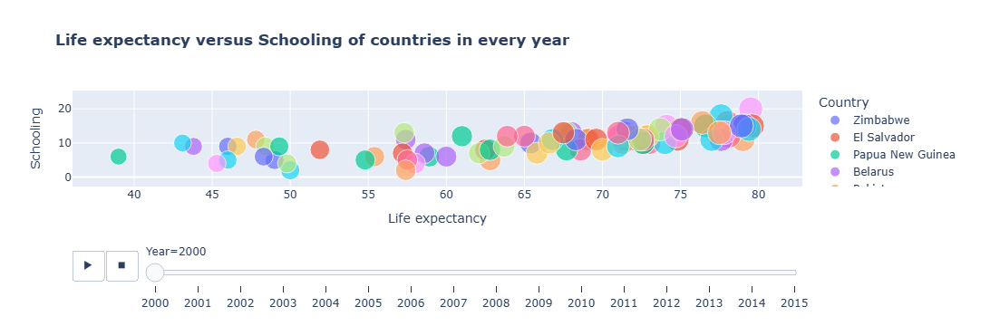

In [112]:
px.scatter(df.sort_values(by="Year"),y="Schooling",x="Life expectancy",animation_frame="Year"
           ,animation_group="Country",color="Country",size="Life expectancy",title="<b> Life expectancy versus Schooling of countries in every year")

**The increasing of years in school over time lead to more `Life expectancy`**

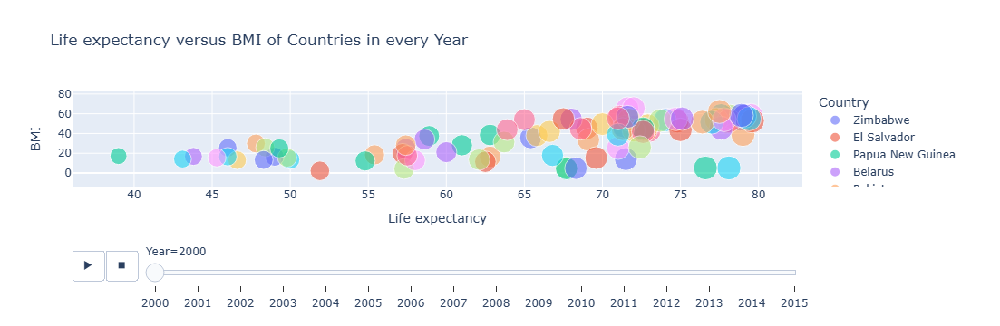

In [113]:
px.scatter(df.sort_values(by="Year"),y="BMI",x="Life expectancy",animation_frame="Year",animation_group="Country"
           ,color="Country",size="Life expectancy"
           ,opacity=0.6,title="Life expectancy versus BMI of Countries in every Year")

****The increasing of `BMI` over `time` lead to more `Life expectancy`**

In [114]:
fig = px.scatter(
    data_frame=df,
    x="Schooling",
    y="Total expenditure", 
    size=df["Population"],          
    color="Life expectancy",    
    title="Schooling, Total Spending, and Life Expectancy",
    hover_name="Country",        
    size_max=60,              
    color_continuous_scale="Viridis", 
)

fig.show(renderer="iframe")

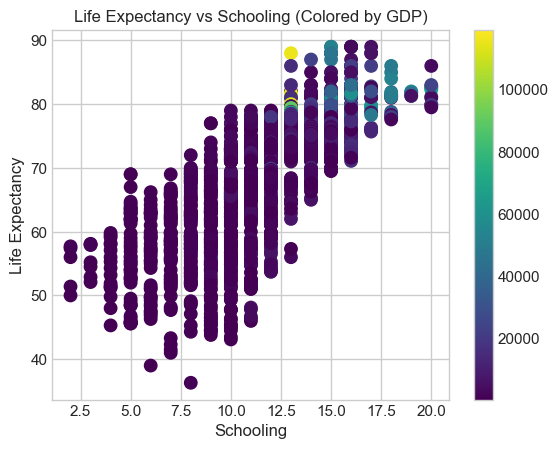

In [115]:
plt.scatter(df["Schooling"], df["Life expectancy"],
            c=df["GDP"], cmap="viridis", s=80)
plt.colorbar(label = "")
plt.xlabel("Schooling")
plt.ylabel("Life Expectancy")
plt.title("Life Expectancy vs Schooling (Colored by GDP)")
plt.show()


**increasing the `GDP` with more years in `school` indicate to `high Life Expectancy`**  

---

## Data Imbalance Check

In [116]:
df["Status"].value_counts()

Status
Developing    1531
Developed      300
Name: count, dtype: int64

**This shows a class imbalance, the Developing category occurs much more than Developed.**

-0.6326733821637816

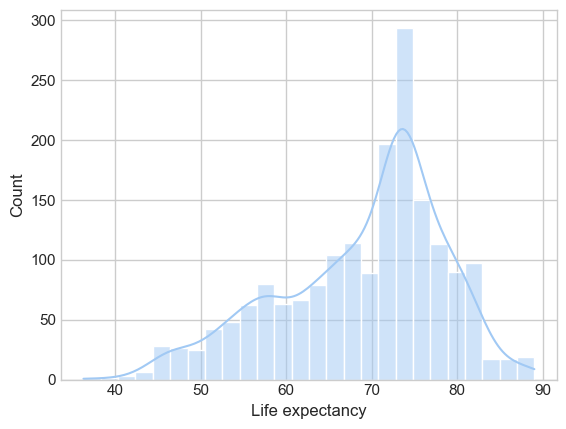

In [117]:
sns.histplot(df["Life expectancy"],kde = True)
df["Life expectancy"].skew()

**The distribution of life expectancy is not perfectly symmetrical**
- **This kind of distribution is common and acceptable in real-world continuous variables.**

---

# Feature Engineering

- **Infant Mortality Rate:**

In [118]:
df["Infant_mortality_rate"] = df["infant deaths"] / df["Population"]

- Health Spending Ratio:

In [119]:
df["Expenditure_per_gdp"] = df["Total expenditure"] / df["GDP"]

- Total Vaccination Rate: 

In [120]:
df["Vaccination_rate"] = (df["Hepatitis B"] + df["Polio"] + df["Diphtheria"]) / 3

- Country Mean Life Expectancy

In [121]:
df["Country_mean_life"] = df.groupby("Country")["Life expectancy"].transform("mean")

---

In [122]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,Polio,Total expenditure,...,HIV/AIDS,GDP,Population,thinness 10-19 years,Income composition of resources,Schooling,Infant_mortality_rate,Expenditure_per_gdp,Vaccination_rate,Country_mean_life
count,1831.000000,1831.000000,1831.000000,1831.000000,1831.000000,1831.000000,1831.000000,1831.000000,1831.000000,1831.000000,...,1831.000000,1831.000000,1.831000e+03,1831.000000,1831.000000,1831.000000,1.831000e+03,1831.000000,1831.000000,1831.000000
mean,2007.796832,68.910049,167.554888,13.990169,4.633498,80.908247,53.844347,38.493610,83.879847,6.005369,...,1.279082,6172.833174,9.851715e+06,4.753031,0.646295,11.584926,8.181617e-05,0.007623,82.906244,68.910049
std,4.558210,9.596731,120.891692,20.343523,3.996491,19.537446,84.900632,19.749333,17.489725,2.271166,...,2.895860,12079.121887,2.410176e+07,4.221803,0.160205,3.096847,7.257494e-04,0.010781,16.099297,9.220120
min,2000.000000,36.300000,7.000000,0.000000,0.010000,39.000000,0.000000,2.000000,43.000000,0.370000,...,0.000000,111.227396,3.400000e+01,0.100000,0.253000,2.000000,0.000000e+00,0.000028,41.000000,45.116667
25%,2004.000000,62.800000,74.000000,1.000000,0.790000,72.000000,0.000000,19.500000,76.000000,4.445000,...,0.000000,528.116280,2.159020e+05,1.500000,0.513500,10.000000,3.639765e-08,0.001014,73.666667,62.140000
50%,2008.000000,71.700000,146.000000,3.000000,4.070000,89.000000,4.000000,44.300000,92.000000,5.910000,...,0.000000,1751.595857,1.458821e+06,3.000000,0.677000,12.000000,1.335843e-06,0.002978,89.000000,72.156250
75%,2012.000000,75.300000,235.000000,20.000000,7.490000,96.000000,70.000000,56.100000,97.000000,7.500000,...,1.000000,5245.304396,7.496857e+06,7.200000,0.761500,14.000000,1.057058e-05,0.010038,95.666667,74.740000
max,2015.000000,89.000000,486.000000,66.000000,12.660000,99.000000,237.000000,77.600000,99.000000,11.160000,...,11.000000,119172.741800,1.986867e+08,19.200000,0.937000,20.000000,2.325581e-02,0.080106,99.000000,82.518750


In [123]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1831 entries, 0 to 2937
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          1831 non-null   object 
 1   Year                             1831 non-null   int64  
 2   Status                           1831 non-null   object 
 3   Life expectancy                  1831 non-null   float64
 4   Adult Mortality                  1831 non-null   float64
 5   infant deaths                    1831 non-null   int32  
 6   Alcohol                          1831 non-null   float64
 7   Hepatitis B                      1831 non-null   float64
 8   Measles                          1831 non-null   float64
 9   BMI                              1831 non-null   float64
 10  Polio                            1831 non-null   float64
 11  Total expenditure                1831 non-null   float64
 12  Diphtheria               

-------

## Encoding

**There are Two Categorical columns :**
- **Country : it is not a feature (It will not be used in life expectancy prediction) will not be encoded**
- **Status : Contain two unique values (developed - developing) ,so using label encoding is the best choice**

In [124]:
df1 = df.copy()
preprocessor = ColumnTransformer(transformers=[("Status_enc",OrdinalEncoder(categories=[['Developing', 'Developed']]),["Status"])]
                             ,remainder="passthrough")

-----

## Transformation

### Do we need to transform?

In [125]:
columnss = ['Adult Mortality',
       'infant deaths', 'Alcohol', 'Hepatitis B', 'Measles', 'BMI', 'Polio',
       'Total expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population',
       'thinness 10-19 years', 'Income composition of resources', 'Schooling']

In [126]:
for i in columnss:
    df1[i] = np.log1p(df[i])

In [127]:
skew_needed = []
for i in columnss:
    before =  df[i].skew()
    after = df1[i].skew()
    print(f"skew before transformation {before} and after {after}")
    if(abs(after) < abs(before)):
        skew_needed.append(i)

skew before transformation 0.8360326519487833 and after -0.9798683900134552
skew before transformation 1.5361234751150972 and after 0.34399437911253733
skew before transformation 0.499007741193506 and after -0.32710628503924505
skew before transformation -1.1448588181133879 and after -1.4257653577053528
skew before transformation 1.405135139331498 and after 0.3645496355667994
skew before transformation -0.2527141875965413 and after -1.2696097370864754
skew before transformation -1.2893900480554548 and after -1.5674910212977418
skew before transformation 0.07828492145005955 and after -0.9569761676826971
skew before transformation -1.3990097002545283 and after -1.6984403599714668
skew before transformation 2.4802973368787526 and after 1.701168491164017
skew before transformation 3.9530528672261283 and after 0.2918946207669372
skew before transformation 4.704138372405218 and after -0.634760587443458
skew before transformation 1.3040778634401253 and after 0.1334049978442182
skew before tra

In [128]:
skew_needed

['infant deaths',
 'Alcohol',
 'Measles',
 'HIV/AIDS',
 'GDP',
 'Population',
 'thinness 10-19 years']

## Transform Data

**So these columns need to be transformed**

In [129]:
df_final = df.copy()
for i in skew_needed:
    df_final[i] = np.log1p(df[i])

**visualiztion of columns before and after `transformed`**

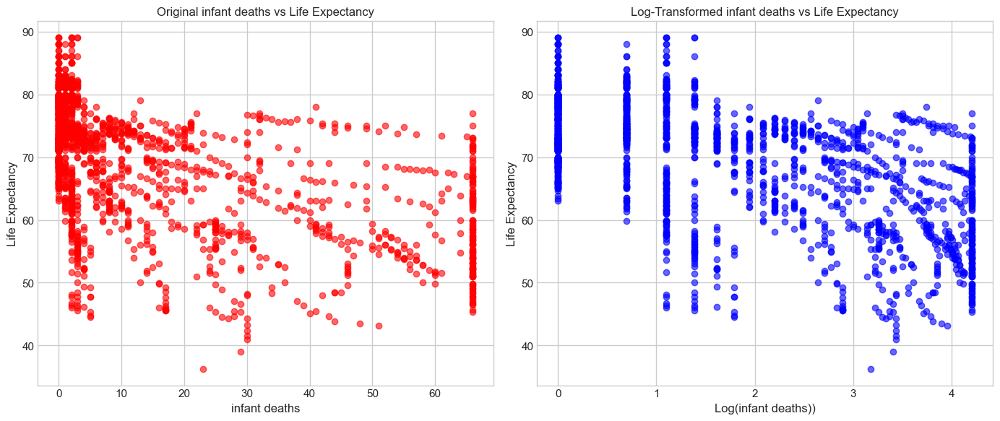

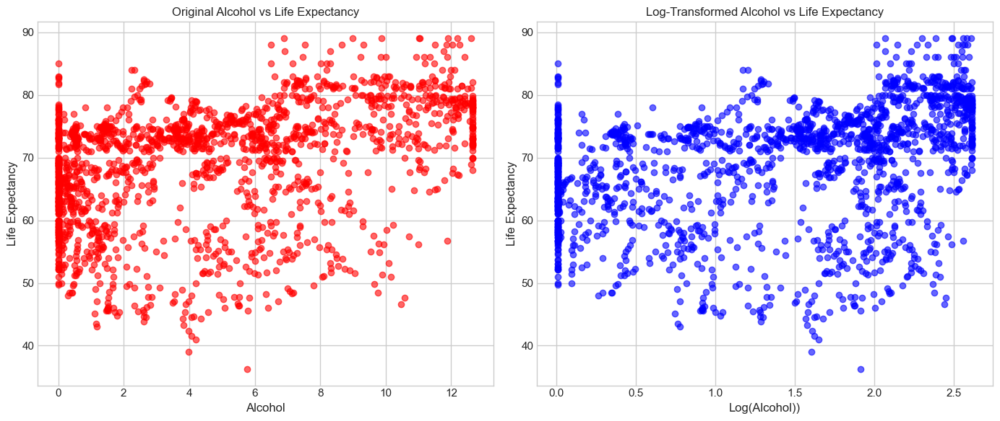

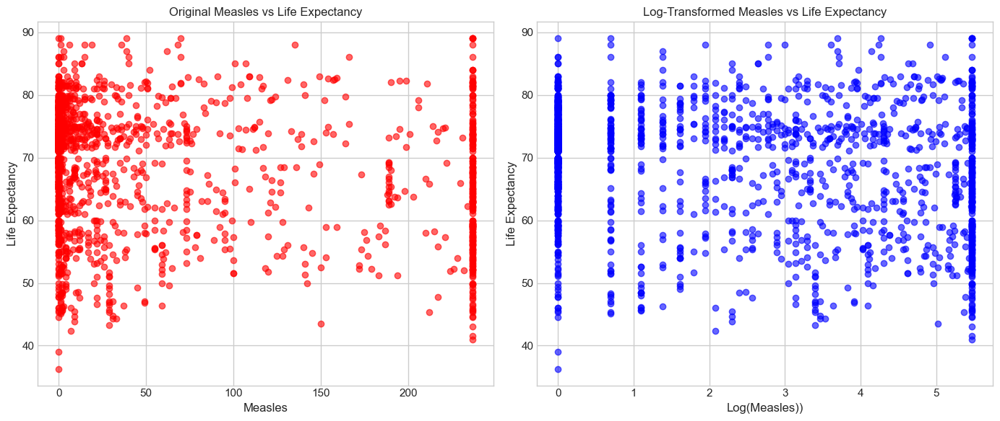

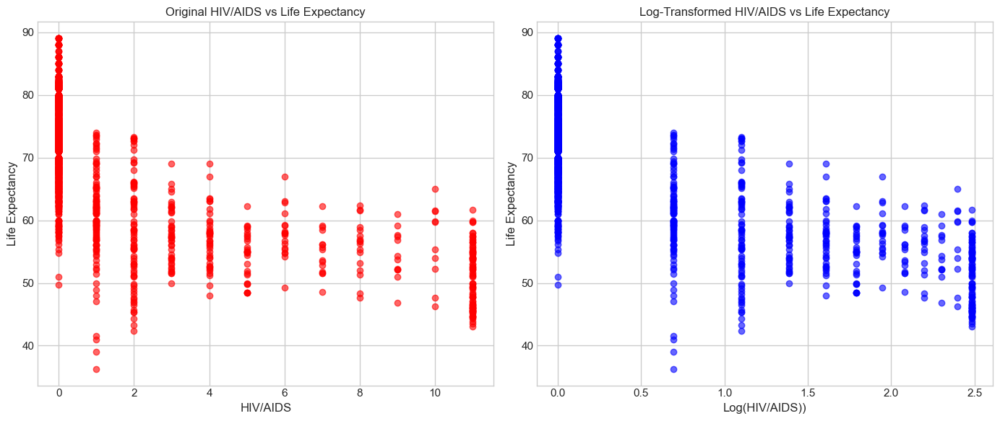

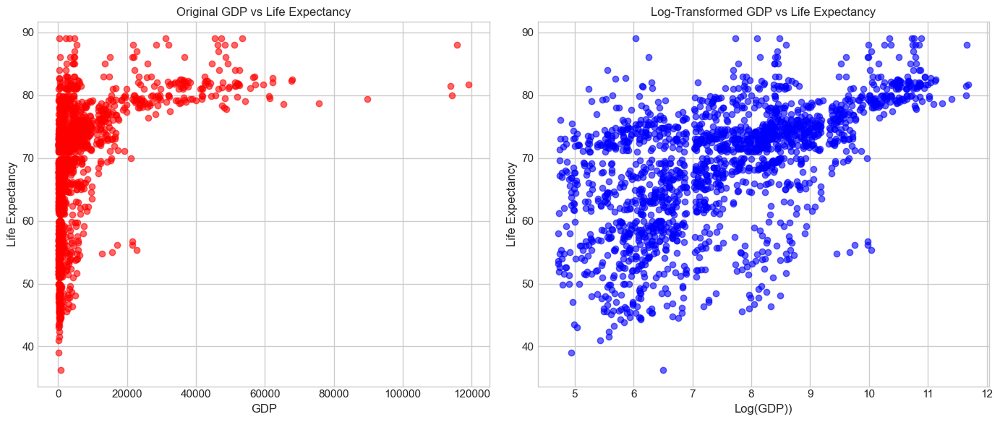

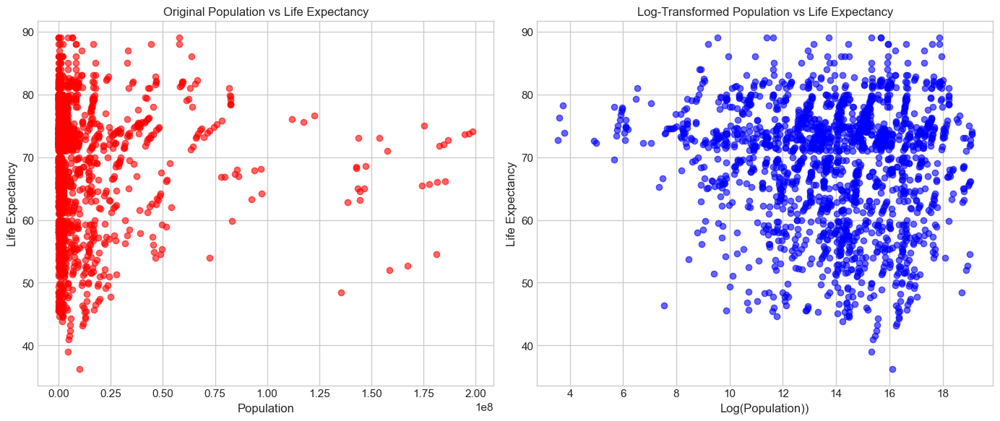

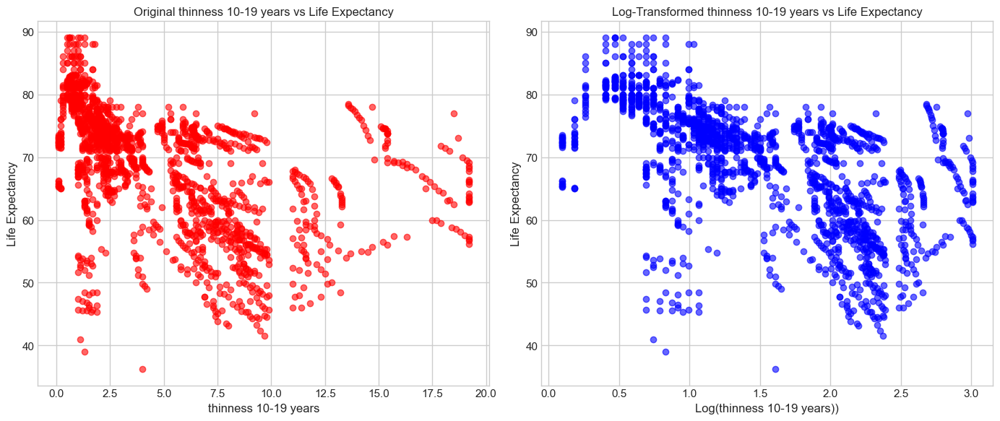

In [130]:
for i in skew_needed:
    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    axs[0].scatter(df[i], df['Life expectancy'], color='red', alpha=0.6)
    axs[0].set_title(f'Original {i} vs Life Expectancy')
    axs[0].set_xlabel(i)
    axs[0].set_ylabel('Life Expectancy')
    
    axs[1].scatter(df_final[i], df1['Life expectancy'], color='blue', alpha=0.6)
    axs[1].set_title(f'Log-Transformed {i} vs Life Expectancy')
    axs[1].set_xlabel(f'Log({i}))')
    axs[1].set_ylabel('Life Expectancy')
    
    plt.tight_layout()
    plt.show()

---

# Prediction

In [131]:
results = {'Model': [],'R2': [],'MSE': []}

## Splitting Data

In [132]:
df_final.columns = df_final.columns.str.replace(' ', '_')
df_final = df_final.rename(columns={"HIV/AIDS": "HIV_AIDS","thinness_10-19_years":"thinness_10_to_19_years"})

In [133]:

X = df_final.drop(columns=["Year",'Life_expectancy', 'Country','Infant_mortality_rate', 'Expenditure_per_gdp',
       'Vaccination_rate', 'Country_mean_life'])
y = df_final['Life_expectancy']

In [134]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Linear Models

### Linear Regression

In [135]:
X_train.head()

,Status,Adult_Mortality,infant_deaths,Alcohol,Hepatitis_B,Measles,BMI,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness_10_to_19_years,Income_composition_of_resources,Schooling
2642,Developing,148.0,0.000000,1.026042,89.0,0.00000,7.1,89.0,5.61,88.0,0.0,7.970230,9.366489,0.095310,0.695,14
2697,Developing,215.0,1.945910,1.360977,99.0,0.00000,48.6,99.0,2.70,99.0,0.0,8.769300,15.532059,1.458615,0.688,10
1566,Developing,268.0,3.713572,0.657520,61.0,0.00000,15.0,65.0,4.81,66.0,0.0,5.761422,16.665011,2.230014,0.457,8
259,Developing,189.0,0.000000,2.036012,98.0,0.00000,48.5,98.0,5.45,98.0,0.0,8.449907,10.424422,1.504077,0.702,12
247,Developed,87.0,0.000000,2.439735,98.0,4.59512,61.3,99.0,9.60,99.0,0.0,10.787784,12.100568,0.587787,0.874,15


In [136]:
Lin_Reg = Pipeline([("preprocessing",preprocessor),("model",LinearRegression())])
Lin_Reg.fit(X_train,y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Status_enc',
                                                  OrdinalEncoder(categories=[['Developing',
                                                                              'Developed']]),
                                                  ['Status'])])),
                ('model', LinearRegression())])

#### Metrics of Linear Regression

In [137]:
y_pred = Lin_Reg.predict(X_test)
Lin_MSE = mean_squared_error(y_test, y_pred, squared=False)
Lin_r2 = r2_score(y_test, y_pred)
print("RMSE:", Lin_MSE)
print("R² Score:", Lin_r2)

RMSE: 3.1283385571201427
R² Score: 0.8935408526351796


In [138]:
results["Model"].append("Linear Regression")
results["R2"].append(Lin_r2)
results["MSE"].append(Lin_MSE)

### Lasso and Ridge Regression

In [139]:
Ridge = Pipeline([("preprocessing",preprocessor),("model",Ridge(alpha=1.0))])
lasso = Pipeline([("preprocessing",preprocessor),("model",Lasso(alpha=0.1))])

Ridge.fit(X_train, y_train)
lasso.fit(X_train, y_train)

rid_r2 = Ridge.score(X_test,y_test)
rid_MSE = mean_squared_error(y_test,y_pred,squared=False)

LAS_r2 = lasso.score(X_test,y_test)
LAS_MSE = mean_squared_error(y_test, y_pred, squared=False)

print(f"r2 of ridge {rid_r2}")
print(f"MSE of ridge {rid_MSE}")
print(f"r2 of Lasso {LAS_r2}")
print(f"MSE of Lasso {LAS_MSE}")

r2 of ridge 0.8920996059988848
MSE of ridge 3.1283385571201427
r2 of Lasso 0.854712668573211
MSE of Lasso 3.1283385571201427


**`Ridge`is better than `Lasso` becaues all features have influence on the Life expectancy**

In [140]:
results["Model"].append("Ridge")
results["R2"].append(rid_r2)
results["MSE"].append(rid_MSE)

results["Model"].append("Lasso")
results["R2"].append(LAS_r2)
results["MSE"].append(LAS_MSE)

**Visualiztion of Linear Models Metrics**

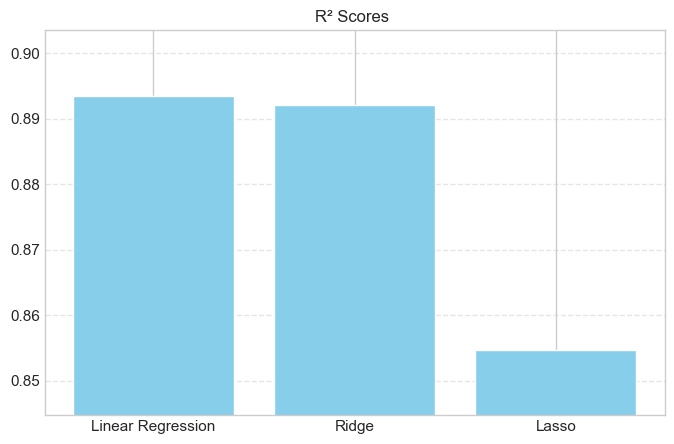

In [141]:
results_df = pd.DataFrame(results)
plt.figure(figsize=(8, 5))
plt.bar(results_df['Model'], results_df['R2'], color='skyblue')
plt.ylabel('')
plt.title('R² Scores ')
plt.ylim(results_df['R2'].min() - 0.01, results_df['R2'].max() + 0.01)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

---

# Tree-Based Models

## Random Forest

In [142]:
rf_model = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor())])
rf_model.fit(X_train, y_train)
rf_r2 = rf_model.score(X_test, y_test)
rf_mse = mean_squared_error(y_test, y_pred)
print("r² of Random Forest:", rf_r2,rf_mse)

r² of Random Forest: 0.9674912424163756 9.786502127964535


In [143]:
results["Model"].append("Random Forest")
results["R2"].append(rf_r2)
results["MSE"].append(rf_mse)

## XGBOOST 

In [144]:
XGB_model = Pipeline([("preprocessing",preprocessor),("model",XGBRegressor())])
XGB_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Status_enc',
                                                  OrdinalEncoder(categories=[['Developing',
                                                                              'Developed']]),
                                                  ['Status'])])),
                ('model',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device=None,
                              early_stopping_rounds=None,
                              enab...
                              feature_types=None, feature_weights=None,
                              gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, ...))])

In [145]:
XGB_r2 = XGB_model.score(X_test, y_test)
XGB_mse = mean_squared_error(y_test, y_pred)
print(f"r2 of XGB is {XGB_r2}")

r2 of XGB is 0.963344878542725


In [146]:
results["Model"].append("XGBOOST")
results["R2"].append(XGB_r2)
results["MSE"].append(XGB_mse)

## LightGBM

In [147]:
Light_model = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor())])
Light_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Status_enc',
                                                  OrdinalEncoder(categories=[['Developing',
                                                                              'Developed']]),
                                                  ['Status'])])),
                ('model', RandomForestRegressor())])

In [148]:
Light_r2 = Light_model.score(X_test, y_test)
LightGBM_model_mse = mean_squared_error(y_test, y_pred)
print(f"r2 of LightGBM is {Light_r2}")

r2 of LightGBM is 0.9680432517404884


In [149]:
results["Model"].append("LightGBM")
results["R2"].append(Light_r2)
results["MSE"].append(LightGBM_model_mse)

In [150]:
results

{'Model': ['Linear Regression',
  'Ridge',
  'Lasso',
  'Random Forest',
  'XGBOOST',
  'LightGBM'],
 'R2': [0.8935408526351796,
  0.8920996059988848,
  0.854712668573211,
  0.9674912424163756,
  0.963344878542725,
  0.9680432517404884],
 'MSE': [3.1283385571201427,
  3.1283385571201427,
  3.1283385571201427,
  9.786502127964535,
  9.786502127964535,
  9.786502127964535]}

In [151]:
results_df = pd.DataFrame(results)
results_df

,Model,R2,MSE
0,Linear Regression,0.893541,3.128339
1,Ridge,0.892100,3.128339
2,Lasso,0.854713,3.128339
3,Random Forest,0.967491,9.786502
4,XGBOOST,0.963345,9.786502
5,LightGBM,0.968043,9.786502


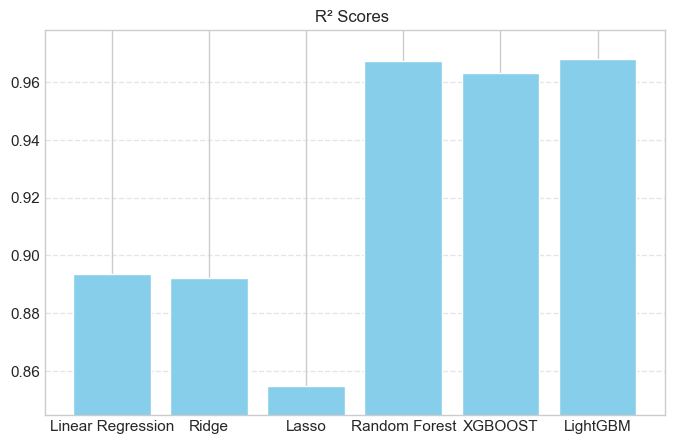

In [152]:
results_df = pd.DataFrame(results)
plt.figure(figsize=(8, 5))
plt.bar(results_df['Model'], results_df['R2'], color='skyblue')
plt.ylabel('')
plt.title('R² Scores ')
plt.ylim(results_df['R2'].min() - 0.01, results_df['R2'].max() + 0.01)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

**In Tree Based Models R2 is the best but the MSE is high , so in Hyper Parameter Tuning i will try to decrease it**

----

# Hyper Parametert Tuning 

## Random Forest

- ### Optuna

In [153]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 200),
        "max_depth": trial.suggest_int("max_depth", 5, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 4),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", 0.5, 0.8])
    }
    model = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor(**params))])
    score = cross_val_score(model, X_train, y_train, cv=5, scoring="neg_mean_squared_error",n_jobs= -1).mean()
    return score

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100,n_jobs=-1)

print(study.best_params)

[I 2025-06-24 07:12:14,938] A new study created in memory with name: no-name-898a3b40-a80d-4b48-a166-716c168c3110
[I 2025-06-24 07:12:18,537] Trial 5 finished with value: -4.783827796423113 and parameters: {'n_estimators': 70, 'max_depth': 9, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 0.8}. Best is trial 5 with value: -4.783827796423113.
[I 2025-06-24 07:12:18,967] Trial 2 finished with value: -4.56932617709335 and parameters: {'n_estimators': 83, 'max_depth': 13, 'min_samples_split': 3, 'min_samples_leaf': 3, 'max_features': 0.5}. Best is trial 2 with value: -4.56932617709335.
[I 2025-06-24 07:12:19,075] Trial 0 finished with value: -5.8886425973086975 and parameters: {'n_estimators': 114, 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_features': 0.8}. Best is trial 2 with value: -4.56932617709335.
[I 2025-06-24 07:12:19,152] Trial 8 finished with value: -5.478752604657148 and parameters: {'n_estimators': 152, 'max_depth': 8, 'min_samples_split

{'n_estimators': 174, 'max_depth': 18, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 0.5}


In [154]:
best_rf = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor(n_estimators=177,min_samples_split=3,
    min_samples_leaf=1,
    max_features=0.5,
    max_depth=16,
    random_state=42))])
best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)

In [155]:
print(f"best r2 of optuna (RF) is {best_rf.score(X_test,y_test)}")

best r2 of optuna (RF) is 0.9676418160469791


- ### Grid Search

In [156]:
param_grid = {
    "model__n_estimators": [50, 100, 200],
    "model__max_depth": [5, 10, 15, None],
    "model__min_samples_split": [2, 5, 10],
    "model__min_samples_leaf": [1, 2, 4],
    "model__max_features": ["sqrt", 0.5, 0.8],
}

rf = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor(random_state=42))])

grid_search_RandomForest = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring="neg_mean_squared_error",
    n_jobs=-1,
    verbose=1,
)

# Fit
grid_search_RandomForest.fit(X_train, y_train)

print("Best parameters (GridSearchCV):", grid_search_RandomForest.best_params_)
print("Best CV MSE:", -grid_search_RandomForest.best_score_)


Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best parameters (GridSearchCV): {'model__max_depth': None, 'model__max_features': 0.5, 'model__min_samples_leaf': 1, 'model__min_samples_split': 2, 'model__n_estimators': 200}
Best CV MSE: 4.204283101479737


In [157]:
best_rf = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor( n_estimators=200,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features=0.5,
    max_depth=15,
    random_state=42))])

best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)

In [158]:
print(f"best r2 of GridSearch is {best_rf.score(X_test,y_test)}")

best r2 of GridSearch is 0.9682522878848195


- ### Randomized Search

In [159]:
param_distributions = {
    "model__n_estimators": [50, 100, 200],
    "model__max_depth": [5, 10, 15, None],
    "model__min_samples_split": [2, 5, 10],
    "model__min_samples_leaf": [1, 2, 4],
    "model__max_features": ["sqrt", 0.5, 0.8],
}

rf = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor(random_state=42))])

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_distributions,
    n_iter=50,          # Number of parameter settings sampled
    cv=5,
    scoring="neg_mean_squared_error",
    n_jobs=-1,
    verbose=1,
    random_state=42
)


random_search.fit(X_train, y_train)

print("Best parameters (RandomizedSearchCV):", random_search.best_params_)
print("Best CV MSE:", -random_search.best_score_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters (RandomizedSearchCV): {'model__n_estimators': 200, 'model__min_samples_split': 2, 'model__min_samples_leaf': 1, 'model__max_features': 0.5, 'model__max_depth': None}
Best CV MSE: 4.204283101479737


In [160]:
best_rf = Pipeline([("preprocessing",preprocessor),("model",RandomForestRegressor( n_estimators=200,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features=0.5,
    max_depth=None,
    random_state=42))])
best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)

In [161]:
print(f"best r2 of RandomizedSearch is {best_rf.score(X_test,y_test)}")

best r2 of RandomizedSearch is 0.969376624938438


--------

# LightGBM

- ### Randomized Search

In [162]:
param_distributions = {
    "model__num_leaves": [31, 63, 127],
    "model__learning_rate": [0.1, 0.05, 0.01],
    "model__n_estimators": [100, 200, 500, 1000],
    "model__max_depth": [-1, 10, 20, 50],
    "model__min_child_samples": [20, 40, 60, 100],
    "model__subsample": [0.6, 0.8, 1.0],
    "model__colsample_bytree": [0.6, 0.8, 1.0],
    "model__reg_alpha": [0.0, 0.01, 0.1, 1.0],
    "model__reg_lambda": [0.0, 0.01, 0.1, 1.0],
}

lgbm = Pipeline([("preprocessing",preprocessor),("model",LGBMRegressor(random_state=42))])

random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_distributions,
    n_iter=50,
    cv=5,
    scoring="neg_mean_squared_error",
    n_jobs=-1,
    verbose=1,
    random_state=42
)

# Fit
random_search.fit(X_train, y_train)

print("Best parameters (RandomizedSearchCV):", random_search.best_params_)
print("Best CV MSE:", -random_search.best_score_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2258
[LightGBM] [Info] Number of data points in the train set: 1464, number of used features: 16
[LightGBM] [Info] Start training from score 68.865369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Best parameters (RandomizedSearchCV): {'model__subsample': 1.0, 'model__reg_lambda': 1.0, 'model__reg_alpha': 0.0, 'model__num_leaves': 31, 'model__n_estimators': 1000, 'model__min_child_samples': 20, 'model__max_depth': 20, 'model__learning_rate': 0.01, 'model__colsample_bytree': 0.6}
Best CV MSE: 4.161955374336545


In [163]:
Randomized_Light = Pipeline([
    ("preprocessing", preprocessor),
    ("model", LGBMRegressor(
        subsample=1.0,
        reg_lambda=1.0,
        reg_alpha=0.0,
        num_leaves=31,
        n_estimators=1000,
        min_child_samples=20,
        max_depth=20,
        learning_rate=0.01,
        colsample_bytree=0.6,
        random_state=42
    ))
])

Randomized_Light.fit(X_train, y_train)

y_pred = Randomized_Light.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Test MSE: {mse:.4f}")
print(f"The best R2 for LightGBM is {Randomized_Light.score(X_test,y_test)}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2258
[LightGBM] [Info] Number of data points in the train set: 1464, number of used features: 16
[LightGBM] [Info] Start training from score 68.865369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Test MSE: 2.7259
The best R2 for LightGBM is 0.9703468158153655


**As Shown The best Model is LightGBM with these Params**

In [164]:
results["Model"].append("Customized LightGBM")
results["R2"].append(Randomized_Light.score(X_test,y_test))
results["MSE"].append(mse)
results_df = pd.DataFrame(results)

In [165]:
results_df

,Model,R2,MSE
0,Linear Regression,0.893541,3.128339
1,Ridge,0.892100,3.128339
2,Lasso,0.854713,3.128339
3,Random Forest,0.967491,9.786502
4,XGBOOST,0.963345,9.786502
5,LightGBM,0.968043,9.786502
6,Customized LightGBM,0.970347,2.725937


------

# Validate Model

In [166]:
cv_results = cross_validate(Randomized_Light, X_train , y_train , cv=5 , scoring='r2' , return_train_score=True)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2225
[LightGBM] [Info] Number of data points in the train set: 1171, number of used features: 16
[LightGBM] [Info] Start training from score 68.997182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2222
[LightGBM] [Info] Number of data points in the train set: 1171, number of used features

In [167]:
print("Train R2 scores:", cv_results['train_score'])
print("Test R2 scores:", cv_results['test_score'])

print("Mean Train R2:", np.mean(cv_results['train_score']))
print("Mean Test R2:", np.mean(cv_results['test_score']))

Train R2 scores: [0.99295062 0.99349212 0.99334309 0.99307087 0.99338197]
Test R2 scores: [0.96036507 0.94600018 0.95413161 0.96121376 0.95051803]
Mean Train R2: 0.9932477337917364
Mean Test R2: 0.9544457275096973


# Deployment

In [168]:
joblib.dump(Randomized_Light,"Life Expectancy.pkl")
joblib.dump(X.columns,"Columns.pkl")

['Columns.pkl']

- ## Using Anvil

In [169]:
anvil.server.connect("server_BTUOPGUXC3JJZDRWAB5X7NFN-6L6RZOYJDRTAVMYU")

@anvil.server.callable
def prediction(Status,Adult_Mortality,infant_deaths,Alcohol,Hepatitis_B,Measles,BMI,Polio
               ,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population
               ,thinness_10_to_19_years,Income_composition_of_resources,Schooling):

    Input = joblib.load("Columns.pkl")
    Model = joblib.load("Life expectancy.pkl")
    test_df = pd.DataFrame(columns = Input)
    test_df.at[0,"Status"] = Status
    test_df.at[0,"Adult_Mortality"] = Adult_Mortality
    test_df.at[0,"infant_deaths"] = infant_deaths
    test_df.at[0,"Alcohol"] = Alcohol
    test_df.at[0,"Hepatitis_B"] = Hepatitis_B
    test_df.at[0,"Measles"] = Measles
    test_df.at[0,"BMI"] = BMI
    test_df.at[0,"Polio"] = Polio
    test_df.at[0,"Total_expenditure"] = Total_expenditure
    test_df.at[0,"Diphtheria"] = Diphtheria
    test_df.at[0,"HIV_AIDS"] = HIV_AIDS
    test_df.at[0,"Population"] = Population
    test_df.at[0,"thinness_10_to_19_years"] = thinness_10_to_19_years
    test_df.at[0,"Income_composition_of_resources"] = Income_composition_of_resources
    test_df.at[0,"Schooling"] = Schooling

    Prediction = Model.predict(test_df)[0]
    return Prediction

Connecting to wss://anvil.works/uplink
Anvil websocket open
Connected to "Published" as SERVER


**https://medical-authorized-okapi.anvil.app**

- ## Using Railway 

In [170]:
#%%writefile app.py

app = Flask(__name__)
CORS(app)

Input_columns = joblib.load('Columns.pkl')
Model = joblib.load('Life expectancy.pkl')

@app.route("/", methods=['GET'])
def index():
    return render_template('index.html')

@app.route('/predict', methods=['POST'])
def predict_endpoint():
    data = request.get_json(force=True)

    test_df = pd.DataFrame(columns=Input_columns)
    test_df.loc[0, :] = None  # init empty
    test_df.at[0, "Status"] = data.get('Status')
    test_df.at[0, "Adult_Mortality"] = data.get('Adult_Mortality')
    test_df.at[0, "infant_deaths"] = data.get('infant_deaths')
    test_df.at[0, "Alcohol"] = data.get('Alcohol')
    test_df.at[0, "Hepatitis_B"] = data.get('Hepatitis_B')
    test_df.at[0, "Measles"] = data.get('Measles')
    test_df.at[0, "BMI"] = data.get('BMI')
    test_df.at[0, "Polio"] = data.get('Polio')
    test_df.at[0, "Total_expenditure"] = data.get('Total_expenditure')
    test_df.at[0, "Diphtheria"] = data.get('Diphtheria')
    test_df.at[0, "HIV_AIDS"] = data.get('HIV_AIDS')
    test_df.at[0, "GDP"] = data.get('GDP')
    test_df.at[0, "Population"] = data.get('Population')
    test_df.at[0, "thinness_10_to_19_years"] = data.get('thinness_10_to_19_years')
    test_df.at[0, "Income_composition_of_resources"] = data.get('Income_composition_of_resources')
    test_df.at[0, "Schooling"] = data.get('Schooling')

    prediction = Model.predict(test_df)[0]
    return jsonify({"prediction": float(round(prediction,2))})

if __name__ == "__main__":
    app.run(debug=True)


 * Serving Flask app '__main__'
 * Debug mode: on


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
 * Restarting with watchdog (windowsapi)


SystemExit: 1

**https://web-production-04fa1.up.railway.app/**

In [171]:
df_final.to_csv("Life_expectancy_F.csv", index=False)